# TASC 2.4

## Change:

### Run #1

In [1]:
%load_ext autoreload
%autoreload 2

%matplotlib inline



from util import *

### path to the pickle files ###
path = "D:\\jeries\\output\\TASC_pickles\\"
if path[-1] != "\\":
    raise ValueError("path must end with a \\. Please try again")

Using TensorFlow backend.


### Run #2

In [2]:

## File names to read
ST = r"rawdata.pickle"
STgraph = r"rawdatagraph.pickle"


## Morphological Features 
MorphoFeatures = ['Area','Ellip_Ax_B_X', 'Ellip_Ax_B_Y', 'Ellip_Ax_C_X', 'Ellip_Ax_C_Y',
                  'EllipsoidAxisLengthB', 'EllipsoidAxisLengthC', 
                  'Ellipticity_oblate', 'Ellipticity_prolate', 
                  'Sphericity', 'Eccentricity']


## BPW Features 
BpwFeatures = ['Velocity_Full_Width_Half_Maximum', 
               'Velocity_Time_of_Maximum_Height', 
               'Velocity_Maximum_Height', 
               'Velocity_Ending_Value', 'Velocity_Ending_Time',
               'Velocity_Starting_Value', 'Velocity_Starting_Time']


rawdata = pd.read_pickle(path+ST)
rawdatagraph = pd.read_pickle(path+STgraph)
rawdata.dropna(inplace=True)
rawdatagraph.dropna(inplace=True)


expNamesInOrder, expNamesInOrderU, expNamesInOrderUGraph, dataAll,\
                                    dataAllGraph = splitingExperimentCol(rawdata,rawdatagraph)


# [print(str(i)+'.',exp) for i,exp in zip(range(0,len(expNamesInOrderU)),expNamesInOrderU)];

val_c = dataAllGraph['Experiment'].value_counts().sort_index()[dataAllGraph['Experiment'].unique()].rename_axis('Experiment').reset_index(name='Number of Cells')
val_c.index.name = 'Index #'
display(val_c)


,Experiment,Number of Cells
Index #,,
0,AM001100425CHR2B02293TNNIRNOCONNN0NNN0NNN0WH00,9228
1,AM001100425CHR2B03293TNNIRNOCONNN0NNN0NNN0WH00,16861
2,AM001100425CHR2B04293TNNIRNOCONNN0NNN0NNN0WH00,23874
3,AM001100425CHR2C02293TMETRNNIRNOCONNN0NNN0WH00,5791
4,AM001100425CHR2C03293TMETRNNIRNOCONNN0NNN0WH00,5362
5,AM001100425CHR2C04293TMETRNNIRNOCONNN0NNN0WH00,5362
6,AM001100425CHR2D02293TGABYNNIRNOCONNN0NNN0WH00,5672
7,AM001100425CHR2D03293TGABYNNIRNOCONNN0NNN0WH00,8852
8,AM001100425CHR2D04293TGABYNNIRNOCONNN0NNN0WH00,5446


In [3]:
val_c_1 = dataAllGraph['Experiment'].value_counts()[dataAllGraph['Experiment'].unique()].rename_axis('Experiment').reset_index(name='Number of Cells')
val_c_1.index.name = 'Index #'
print(expNamesInOrderU)
display(val_c_1)


['AM001100425CHR2B02293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2B03293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2B04293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2C02293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2C03293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2C04293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D02293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D03293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D04293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2E02293TNNIRMETRGABYNOCONNN0WH00'
 'AM001100425CHR2E03293TNNIRMETRGABYNOCONNN0WH00'
 'AM001100425CHR2E04293TNNIRMETRGABYNOCONNN0WH00']


,Experiment,Number of Cells
Index #,,
0,AM001100425CHR2B02293TNNIRNOCONNN0NNN0NNN0WH00,9228
1,AM001100425CHR2B03293TNNIRNOCONNN0NNN0NNN0WH00,16861
2,AM001100425CHR2B04293TNNIRNOCONNN0NNN0NNN0WH00,23874
3,AM001100425CHR2C02293TMETRNNIRNOCONNN0NNN0WH00,5791
4,AM001100425CHR2C03293TMETRNNIRNOCONNN0NNN0WH00,5362
5,AM001100425CHR2C04293TMETRNNIRNOCONNN0NNN0WH00,5362
6,AM001100425CHR2D02293TGABYNNIRNOCONNN0NNN0WH00,5672
7,AM001100425CHR2D03293TGABYNNIRNOCONNN0NNN0WH00,8852
8,AM001100425CHR2D04293TGABYNNIRNOCONNN0NNN0WH00,5446


# Change and Run #3

## Sample cells
Let's assume you have 3 wells: [0,1,2] \
Well 0 and 1 have 500 cells \
While well 2 have 1000 cells \
You wish to have the same amount of cell in each well - that is why we've created the "SAMPLE" variable and his dependencies:
#### SAMPLE: 
True/False (Boolean) - (whether you want to sample cells or not) 
#### expList: 
[  ] - is an integer list determine the indices you would like to sample (for example in the case we presented here it is [3]
#### CellSample: 
an integer - depend on the sample size (if you wish to have half of the cells: 2, if you wish to have 1/3 of the cells it will be: 3... etc.) 


In [4]:
### experiments if sample needed
SAMPLE = False                             ## Boolean
expList = [16,17,18,19,20,21,22,23]     ## an integer list

### sample step
CellSample = 2                          ## integer

## Indices list (indices for the wells you wish to analyze *without* sampling)

np.arange() is a NumPy function that creates an aranged list with running number 
see the link below for more information:
https://numpy.org/doc/stable/reference/generated/numpy.arange.html

Many times it can help you shorten your numbering\
If you want to collect all the first 16 wells you can just use:\
expListT = np.arange(16)\
instead of:\
expListT = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15] 

#### Rearage the experiments
expListT can be used to arange the wells appearance.\
If you have for example three wells and your indices are [0,1,2] but you want it to appear as [1,2,0] you can control it by typing the indices in different order.\
** this is available only if you set SAMPLE to False **

In [5]:
## experiments need to be analyze (exclude the sampled experiments)
expListT = [0,1,2,3,4,5,6,7,8,9,10,11]


## Choose a unique title for this run
All the files this script will create will get "title" as a prefix to there name

In [6]:
## Change title experiment Name ##
title = 'jeries_test'
## Change the number of clusters
k_cluster = 3

## Choose whether to include the kinetics or morphology features
#### If you want *only* kinetic features you should set it to "True"
MorphoOut:\
True/False - Boolean variable

#### If you want *only* morphological features you should set it to "True"
MorphoIn:\
True/False - Boolean variable

## If you wish to run it on the entire features list set both to "False"

In [7]:

## if analyze only kinetics - True, else False ##
MorphoOut = False
## if analyze only morphological - True, else False ##
MorphoIn = False

## Treatments combination
### This part is a bit tricky so pay attention
Here you should separate the treatments you have used in your experiments (as you remember each treatment is 4 characters)\
In the example here the treatments are:\
HGF2,HGF7,DOX1,PHA4,PHA3\
\
You also have a combination of treatments - the program will find them automatically\
\
Treatments that don't have a combination with each other should be at the same list:\
[['HGF2','HGF7','DOX1'], ['PHA4','PHA3']]\
\
In this example we won't find a well titled: 'HGF2HGF7' or 'HGF2DOX1'\
BUT\
we may find 'HGF7PHA4'\
\
so HGF7 and PHA4 need to be in a different list\
The pattern is:\
combin = [[X1, X2,..],[Y1, Y2,..],[Z1, Z2,..]]\

#### If you have 'CON' well do not include it in any list


In [8]:
## Change to the names of the *treatments* that can be combined => combin = [[X1, X2,..],[Y1, Y2,..],[Z1, Z2,..]]
combin = [["NOCO"]]

## Single treatment/Single control/Multiple cell lines

Variables:\
singleTREAT:\
Boolean - True/False\
\
singleCONTROL:\
Boolean - True/False\
\
multipleCL:
Boolean - True/False\
\


This part depends on the well list you picked...\
let's assume that we have multiple treatments and multiple cell lines, then:\


singleTREAT = False    ## Because we have multiple treatments\


singleCONTROL = True  ## Because we have multiple control wells (one for each cell line) BUT they are all the same 'CON' representation\


multipleCL = True      ## Because we have multiple cell lines (BT45,MDA2,MCF7)\



In [10]:
## if we analyze a single treatment with numerous cell lines for example ##
singleTREAT = False

## if a single well is control ##
singleCONTROL = True

## if Multiple cell lines being analyzed ##
multipleCL = False



## Graph properties
### you may found yourself returning to this section a lot.. it is difficult to predict it..
### it will affect your graph appearance..
#### nrows, ncols:
Both are integers... in the case presented here we have 3 cell lines and 8 different treatments (including combinations)\
so we arrange it in that way:\
\
nrows=3  ## each row is a cell line\
ncols=8  ## each column is a treatment\
\
The default values - if you do not wish to change it, let it be:\
nrows=0\
ncols=1
#### nColor, nShades:
Both are integers...in case of this example..\
\
nColor=3\
nShades=8\
\
The default values - if you do not wish to change it, let it be:\
nColor=0\
nShades=0
#### nColorTreat, nShadesTreat:
Number of colors and shades in the Treatments titled figures (only if needed) - currently do not change it\
\
nColorTreat=0\ 
nShadesTreat=0\
these are the default values - integers
#### nColorLay, nShadesLay:
Number of colors and shades in the y-position titled figures (only if needed) - currently do not change it\
type: integer\
\
nColorLay=3\
nShadesLay=3
#### figsizeEXP, figsizeTREATS, figsizeCL:
type: integer tuple (int,int)
figure size in proportion to the number of sub figures in the experiment titled figures\
figsizeEXP = (40,15)  \
figure size in proportion to the number of sub figures in the treatments titled figures\
figsizeTREATS = (30, 15)\
figure size in proportion to the number of sub figures in the CellLines titled figures\
figsizeCL= (15,5) 


In [11]:
##### graph properties #####
## number of rows and columns in the experiment titled figures
nrows=1
ncols=12
## number of colors and shades in the experiment titled figures
nColor= 12
nShades= 2
## number of colors and shades in the Treatments titled figures (only if needed)
nColorTreat=0 
nShadesTreat=0
## number of colors and shades in the y position titled figures (only if needed)
nColorLay=3
nShadesLay=3
## figure size in proportion to the number of sub figures in the experiment titled figures
figsizeEXP = (25,5)             
## figure size in proportion to the number of sub figures in the treatments titled figures
figsizeTREATS = (15, 5)
## figure size in proportion to the number of sub figures in the CellLines titled figures
figsizeCL= (15,15) #(15, 5)




## chi-squared test variable
#### CON, CL, wellCON
control name can be either: 1 ['X'] or some ['X', 'Y',...] \
CON = ['CON']\
Cell Line can be either: 1 ['X'] or some ['X', 'Y',...] \
CL = ['BT54','MDA2','MCF7']\
Experiment can be either: 1 ['X'] or some ['X', 'Y',...] \
##### wellCON is the well name without 'NNN0'  
wellCON = ['HA033080917CHR1C02BT54CON0WH00','HA033080917CHR1D02MDA2CON0WH00', 'HA033080917CHR1F02MCF7CON0WH00']

#### controls:
list of strings, for example - ['BT54HGF7]  if you wish the 'BT54HGF7' will be the control\
\
control = []  ## in our case

In [12]:
### chi square tests ###
# control name can be either: 1 or some ['X', 'Y',...] #
CON = ['NOCO']
# Cell Line can be either: 1 or some ['X', 'Y',...] #
CL = ['293T']
# Experiment can be either: 1 or some ['X', 'Y',...] #
wellCON = ['AM001100425CHR2B02293TNNIRNOCOWH00'
 'AM001100425CHR2B03293TNNIRNOCOWH00'
 'AM001100425CHR2B04293TNNIRNOCOWH00'
 'AM001100425CHR2C02293TMETRNNIRNOCOWH00'
 'AM001100425CHR2C03293TMETRNNIRNOCOWH00'
 'AM001100425CHR2C04293TMETRNNIRNOCOWH00'
 'AM001100425CHR2D02293TGABYNNIRNOCOWH00'
 'AM001100425CHR2D03293TGABYNNIRNOCOWH00'
 'AM001100425CHR2D04293TGABYNNIRNOCOWH00'
 'AM001100425CHR2E02293TNNIRMETRGABYNOCOWH00'
 'AM001100425CHR2E03293TNNIRMETRGABYNOCOWH00'
 'AM001100425CHR2E04293TNNIRMETRGABYNOCOWH00']

controls = []

# Sorting controls by length to avoid problems later
controls.sort(key=len, reverse=True)

## Hierarchical clustering (HC), AutoEncodes (AE) models
### These currently unavailable - DO NOT CHANGE IT 
#### HC, AE_model
type: Boolean - True/False\
whether to calculate the HC or not\
whether to calculate the AE model or not
#### model_name
type = string - the name of the saved model


In [13]:
## If Hirarchical clustering needed (apply only on small amount of experiment - depends on the number of cells)
HC=False
## If AutoEncoder if wanted - True else: False
AE_model = False
## Name of AE model if known example: 'd100220h122850'
model_name = 'd100220h122850'

# THE END OF THE MODIFIEDABLE SECTION
## NOW go to "kernel"->"Restart and Run All"

# Please do not change the code from now on .. it will affect the results..

In [14]:
## Choose the index of the experiments you want to analyze

# expList = [52,53,56,57,58,59] ## [0,1,2,..]
if SAMPLE:
    expM, Features, dataSpec, dataSpecGraph = analysisExp(dataAll,dataAllGraph,
                                                         expList,expNamesInOrderU)
    expM

### sample some of the experiments if needed

In [15]:
print(expListT,expNamesInOrderU)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11] ['AM001100425CHR2B02293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2B03293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2B04293TNNIRNOCONNN0NNN0NNN0WH00'
 'AM001100425CHR2C02293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2C03293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2C04293TMETRNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D02293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D03293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2D04293TGABYNNIRNOCONNN0NNN0WH00'
 'AM001100425CHR2E02293TNNIRMETRGABYNOCONNN0WH00'
 'AM001100425CHR2E03293TNNIRMETRGABYNOCONNN0WH00'
 'AM001100425CHR2E04293TNNIRMETRGABYNOCONNN0WH00']


The experiment you choose is:
AM001100425CHR2B02293TNNIRNOCOWH00
AM001100425CHR2B03293TNNIRNOCOWH00
AM001100425CHR2B04293TNNIRNOCOWH00
AM001100425CHR2C02293TMETRNNIRNOCOWH00
AM001100425CHR2C03293TMETRNNIRNOCOWH00
AM001100425CHR2C04293TMETRNNIRNOCOWH00
AM001100425CHR2D02293TGABYNNIRNOCOWH00
AM001100425CHR2D03293TGABYNNIRNOCOWH00
AM001100425CHR2D04293TGABYNNIRNOCOWH00
AM001100425CHR2E02293TNNIRMETRGABYNOCOWH00
AM001100425CHR2E03293TNNIRMETRGABYNOCOWH00
AM001100425CHR2E04293TNNIRMETRGABYNOCOWH00
The cell line is:
293T
293T
293T
293T
293T
293T
293T
293T
293T
293T
293T
293T
The treatments are:
Number of features:  49 

The Features are:
1. Area
2. Acceleration
3. Acceleration_OLD
4. Acceleration_X
5. Acceleration_Y
6. Coll
7. Coll_CUBE
8. Confinement_Ratio
9. Directional_Change
10. Overall_Displacement
11. Displacement_From_Last_Id
12. Displacement2
13. Ellip_Ax_B_X
14. Ellip_Ax_B_Y
15. Ellip_Ax_C_X
16. Ellip_Ax_C_Y
17. EllipsoidAxisLengthB
18. EllipsoidAxisLengthC
19. Ellipticity_oblate
20

<IPython.core.display.Latex object>

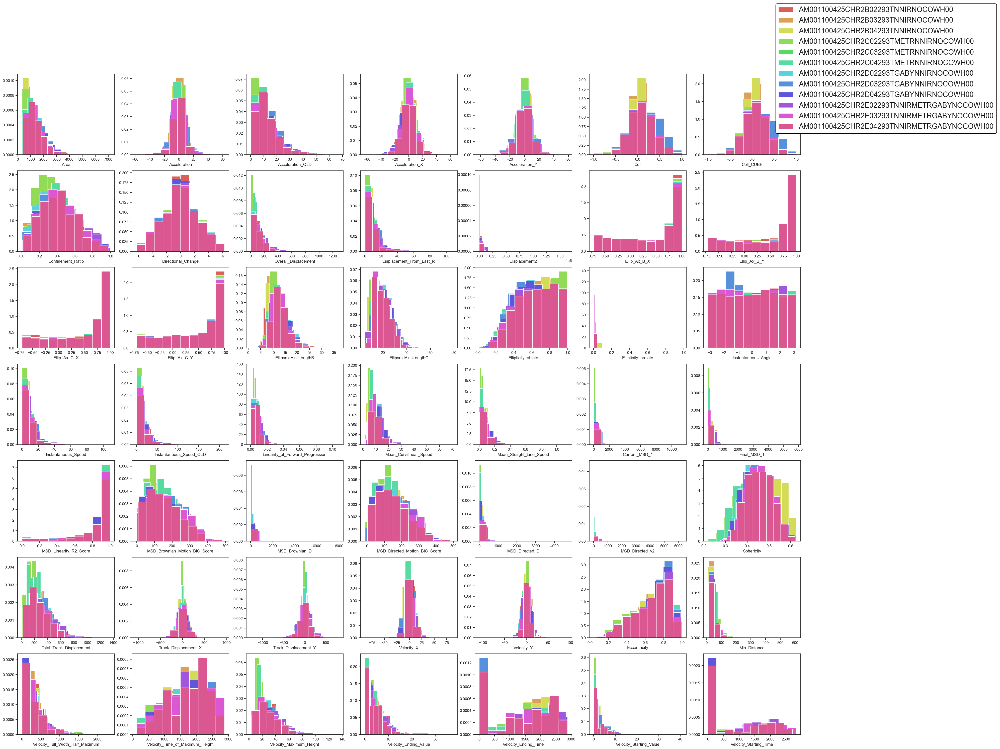

<IPython.core.display.Latex object>

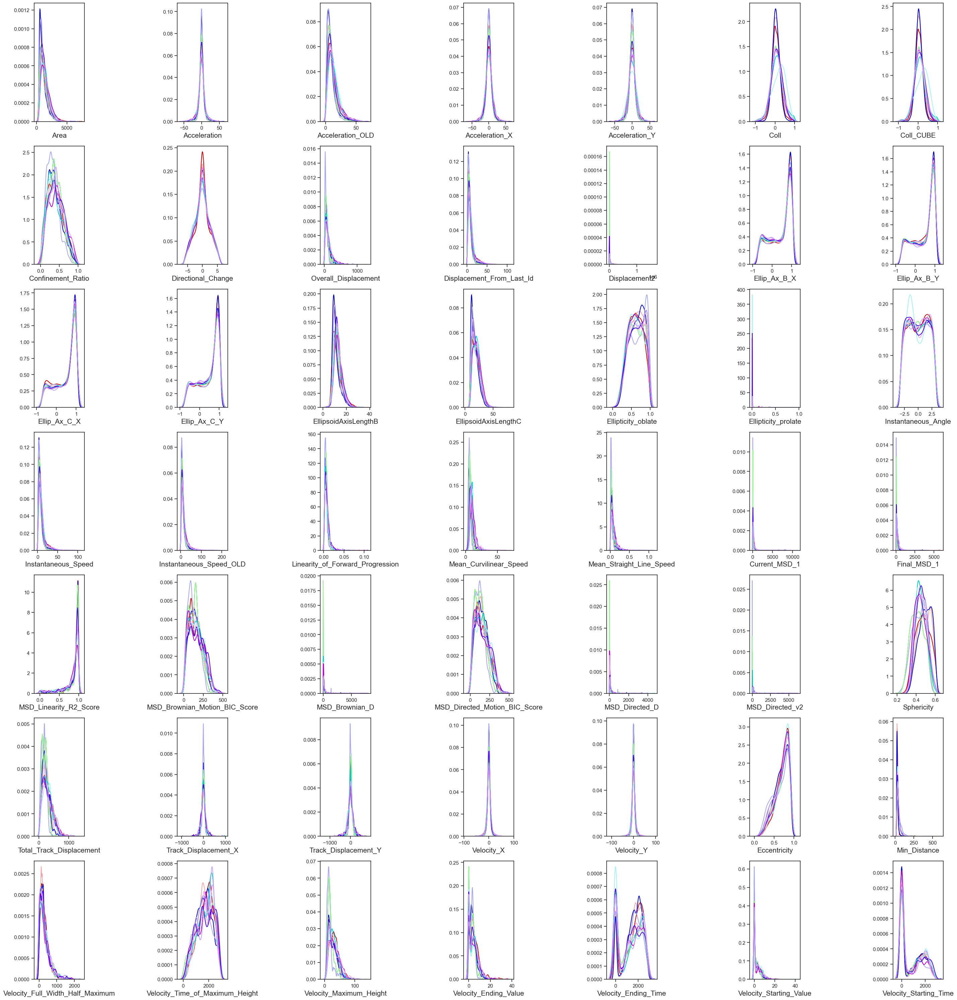

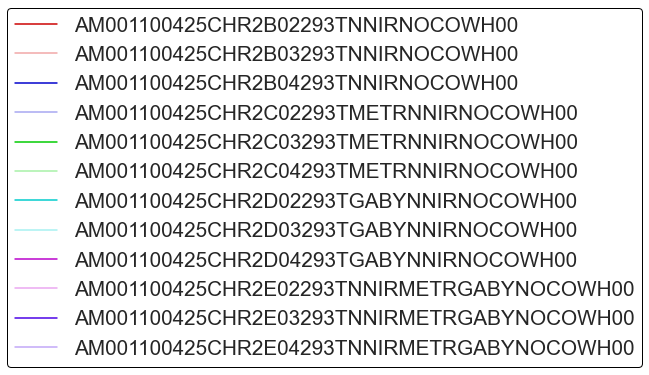

In [16]:
## Change these 2: # CellSample=2 => sample every second cell track, CellSample=3 => sample every third cell track
# SAMPLE=True
# CellSample = 2
FigureNumber = 1

if SAMPLE:
    uParent = dataSpecGraph['Parent'].unique()
    ParentList = [par if par in uParent[::CellSample] else 0 for par in dataSpecGraph['Parent']]
    dataSpecGraphP = dataSpecGraph.loc[dataSpecGraph['Parent']==ParentList].copy()
    expM = dataSpecGraphP['Experiment'].unique()
    expM = [e for e in expM]

    
## Choose the index of the experiments you want to analyze
# rest of the experiments
# expListT = np.append(np.append(np.arange(38),(np.arange(40,46))),np.arange(48,52)).tolist() ## [0,1,2,..]
exp, Features, dataSpec, dataSpecGraph = analysisExp(dataAll.copy(),dataAllGraph.copy(),
                                                     expListT,expNamesInOrderU)
if SAMPLE:
    dataSpecGraphN = pd.concat([dataSpecGraph,dataSpecGraphP])
    exp.extend(expM)
else:
    dataSpecGraphN = dataSpecGraph

if MorphoOut:
    Features = Features.drop(MorphoFeatures).copy()
if MorphoIn:
    MorphoFeatures.append('Experiment')
    Features = MorphoFeatures
# Histogram
histogramData(exp,dataSpecGraphN,Features[:-1],FigureNumber)
FigureNumber+=1
histogramDataKDE(exp,dataSpecGraphN,Features[:-1],FigureNumber,nColor=nColor, nShades=nShades)
FigureNumber+=1

<IPython.core.display.Latex object>

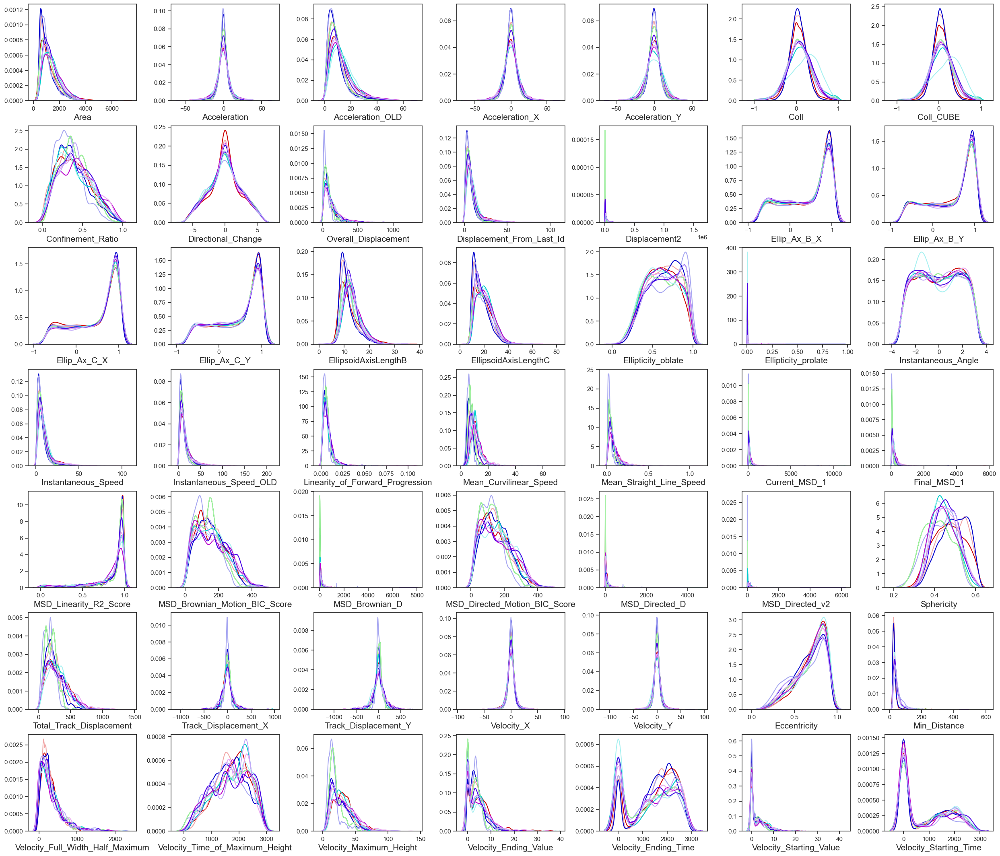

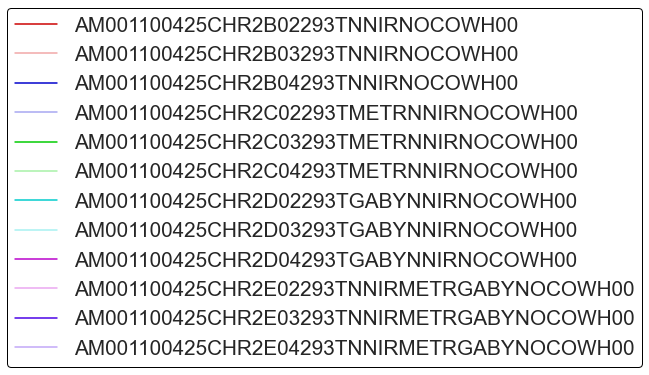

In [17]:
def histogramDataKDE(exp,data,Features,FigureNumber,nColor=0,nShades=0):
    display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
    nrows, ncols = get_rows_cols(len(Features))
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols,figsize=(25.,25.),dpi=100)
    fig2, ax2 = plt.subplots(figsize=(10,6))
    if nColor==0:
        colors = sns.color_palette("hls", len(exp))
    else:
        colors = ChoosePalette(nColor,nShades)
    for par, ax in zip(Features,axes.flat):
        for label, color in zip(range(len(exp)), colors):
            vals = np.float64(data[par].loc[data['Experiment']==exp[label]])
            sns.kdeplot(vals, ax=ax, 
                    label=exp[label], color=color, #density=True, stacked=True,
                    )
            ax.set_xlabel(par,fontdict={'fontsize':15}) 
#     fig.set_tight_layout(True)
    labels_handles = {label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}

#     fig.set_tight_layout(False)
    for a in axes.flat:
        try:
            a.get_legend().remove()
        except:
            display('')
    fig2.legend(labels_handles.values(),
               labels_handles.keys(),
               loc='center',fontsize='xx-large',
               framealpha=1,edgecolor='black'
              )
    fig.tight_layout(pad=1.01)

    fig.subplots_adjust(top=0.85)

    plt.show()
    return None

histogramDataKDE(exp,dataSpecGraphN,Features[:-1],FigureNumber,nColor=nColor, nShades=nShades)


<IPython.core.display.Latex object>

12


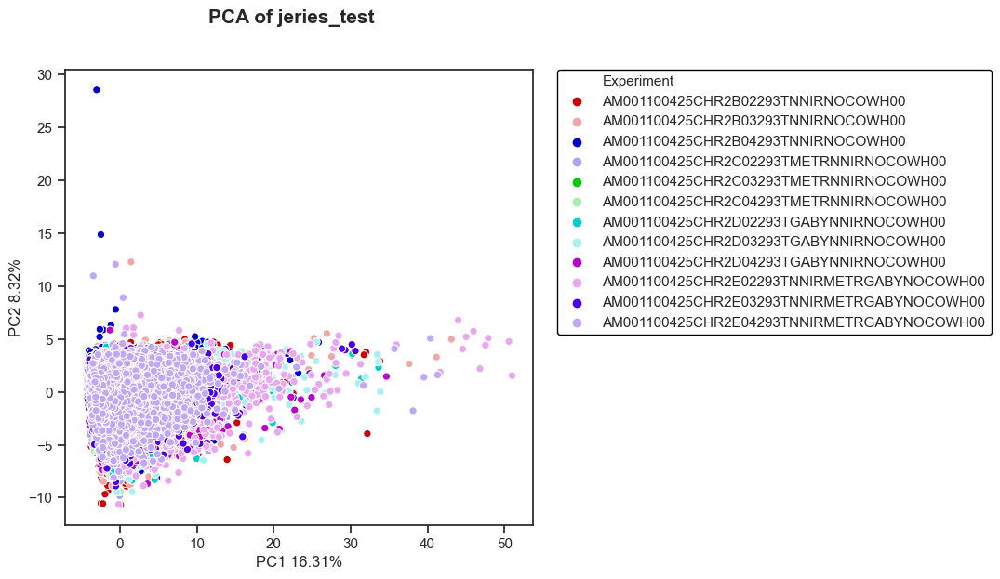

<IPython.core.display.Latex object>

There are 1 signficant components


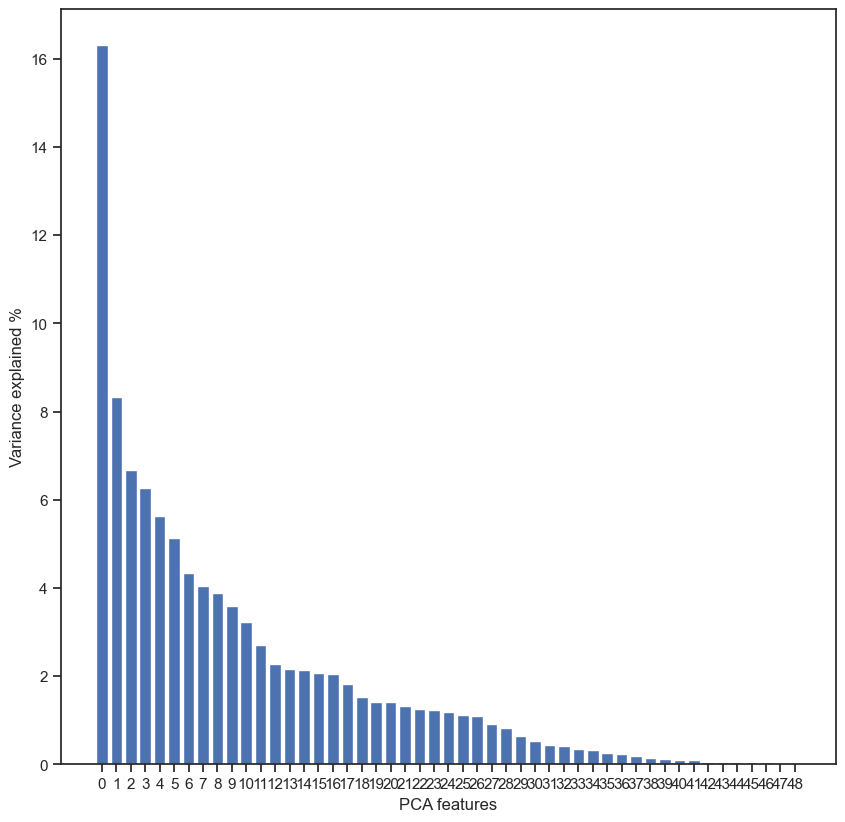

<IPython.core.display.Latex object>

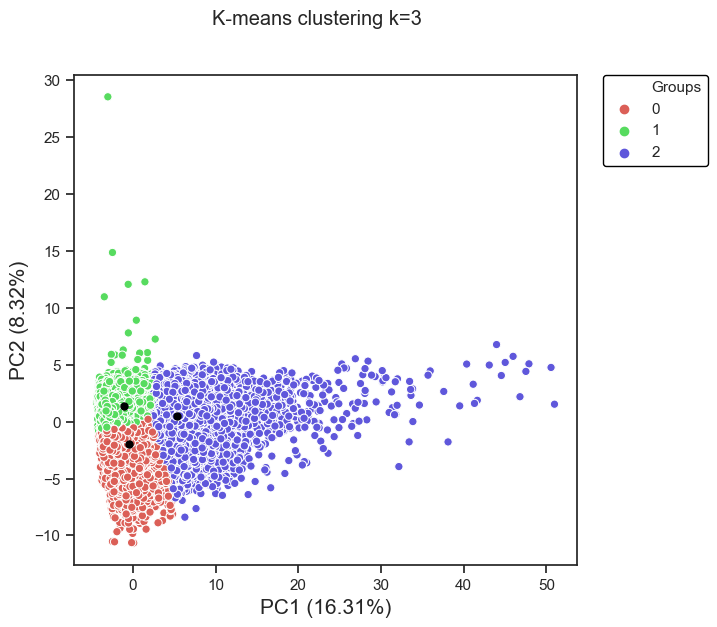

<IPython.core.display.Latex object>

46


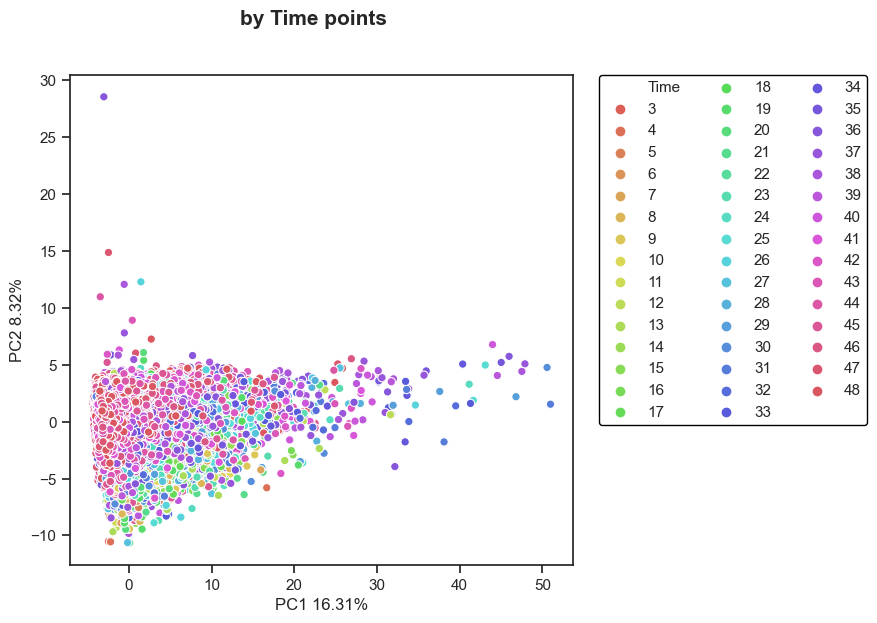

<IPython.core.display.Latex object>

1


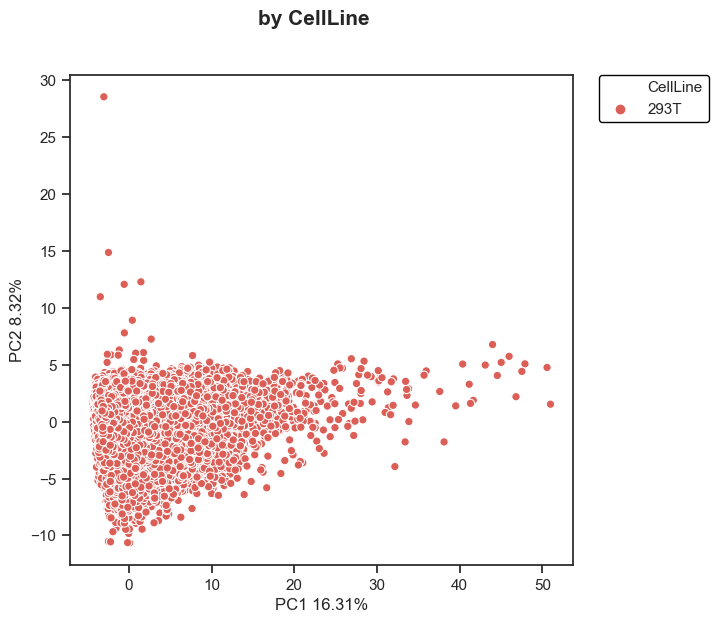

<IPython.core.display.Latex object>

1


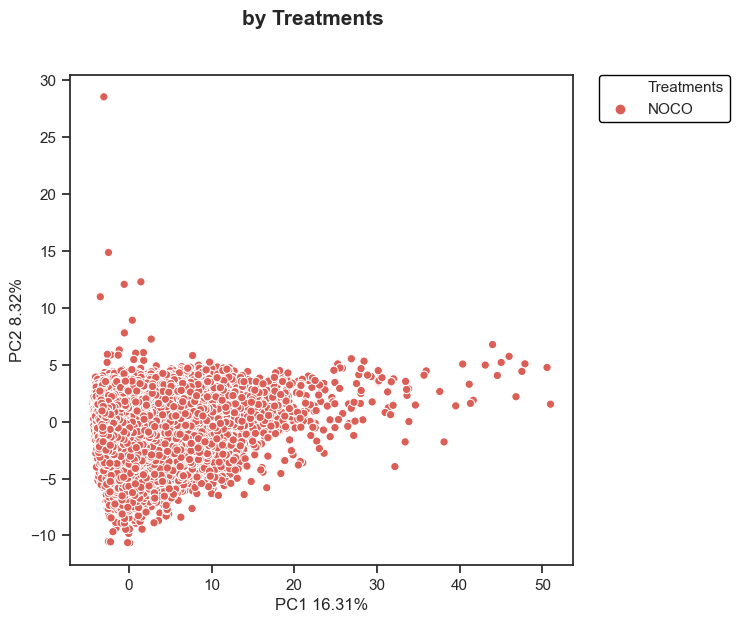

<IPython.core.display.Latex object>

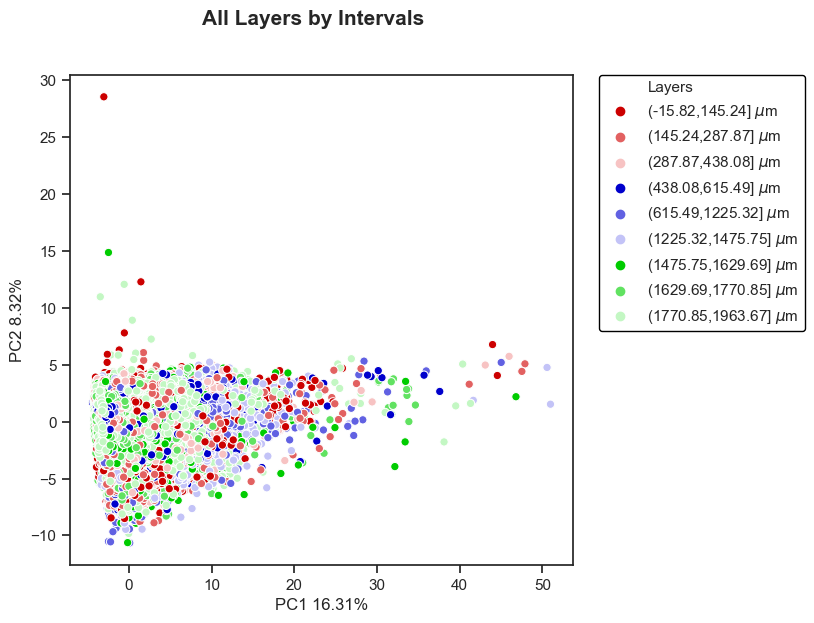

<IPython.core.display.Latex object>

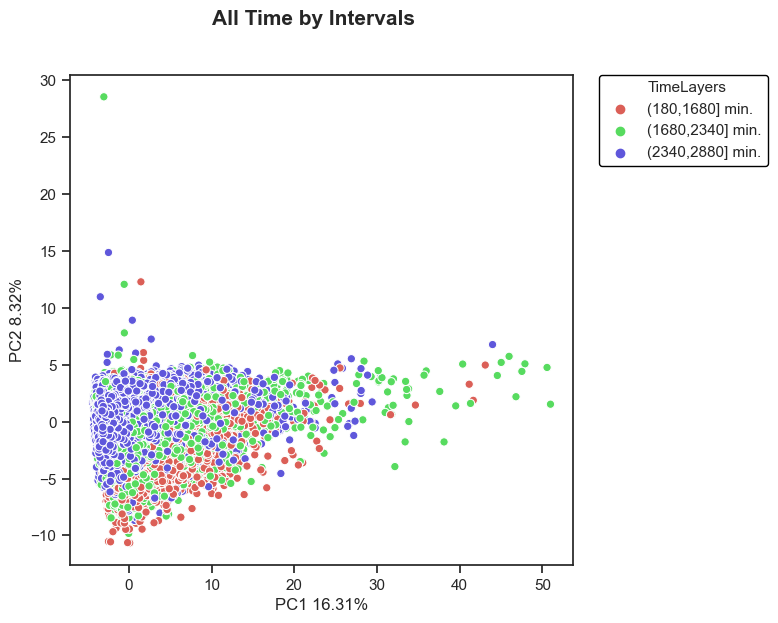

<IPython.core.display.Latex object>

9


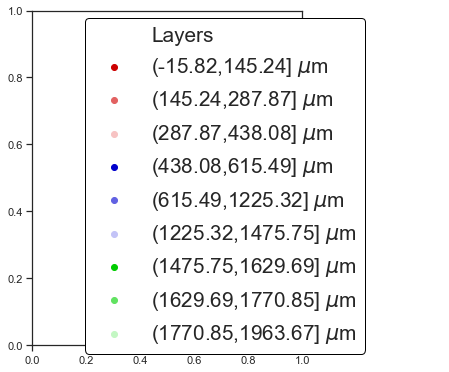

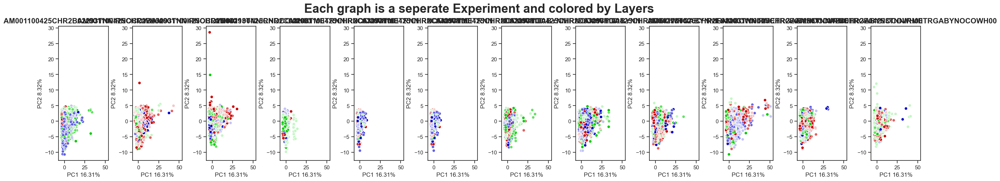

9


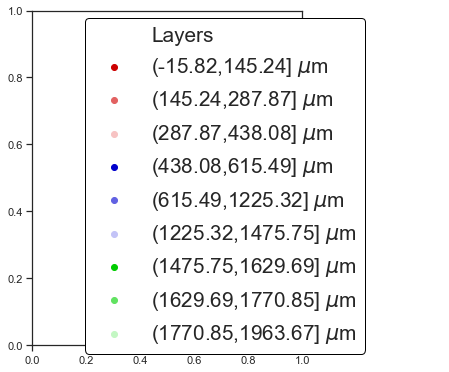

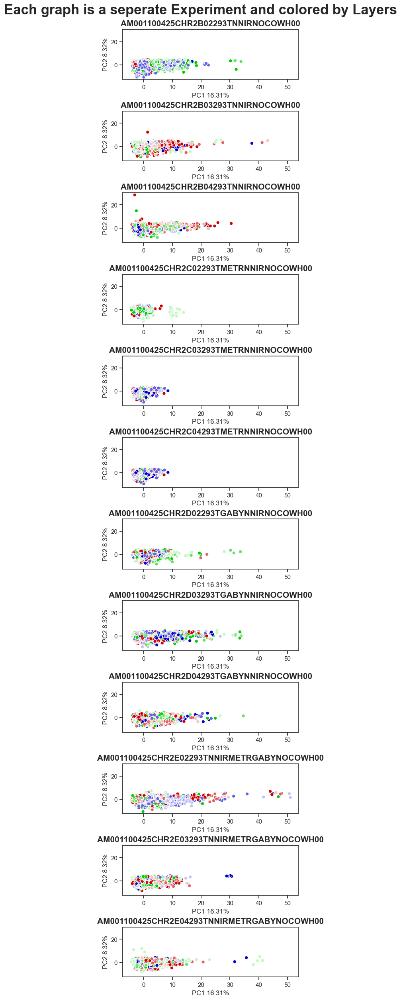

<IPython.core.display.Latex object>

12


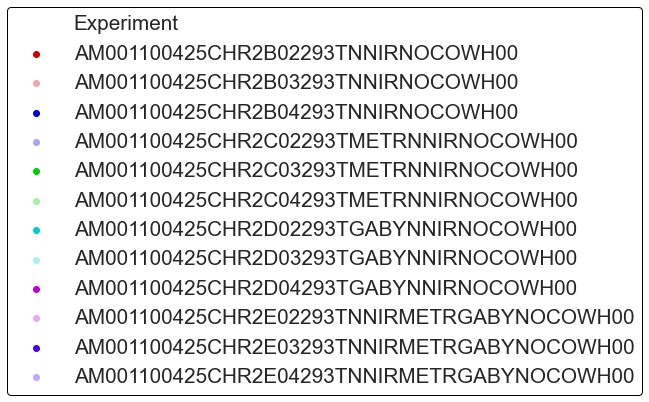

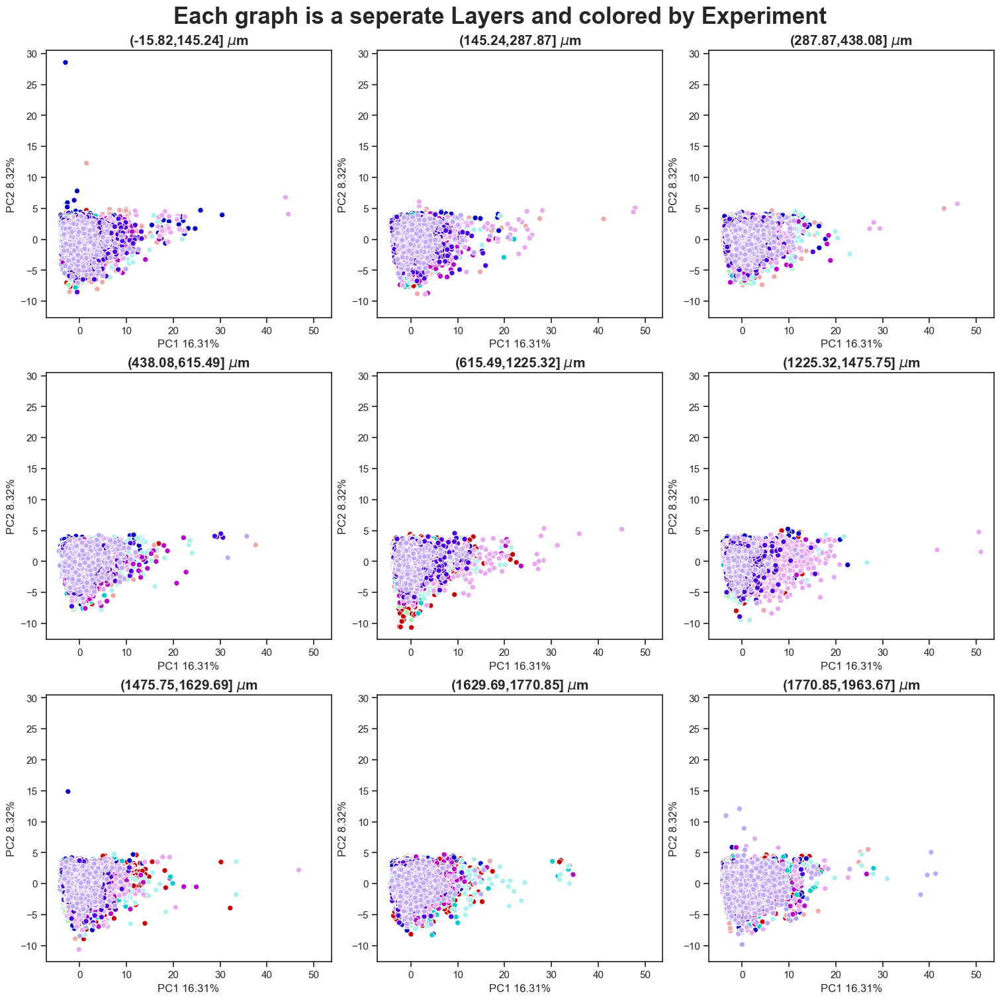

<IPython.core.display.Latex object>

12


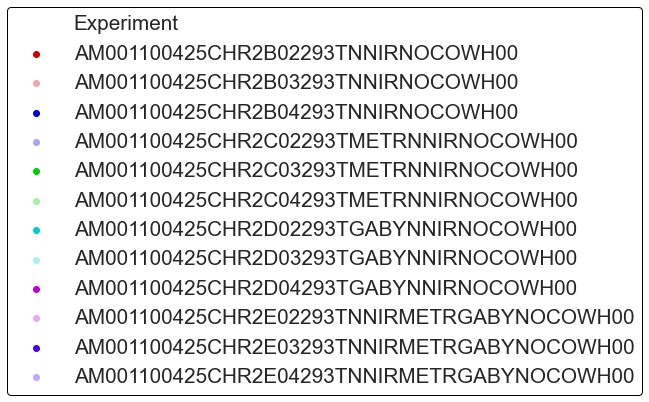

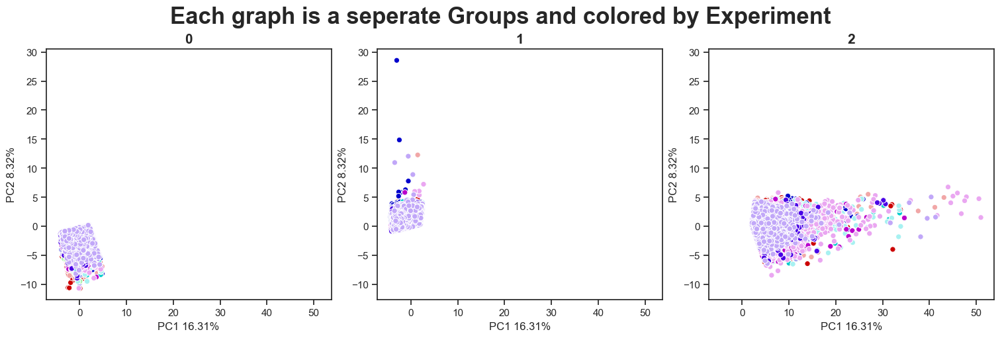

<IPython.core.display.Latex object>

3


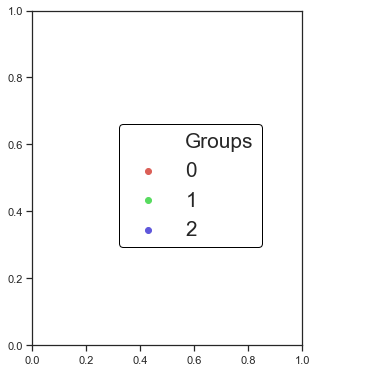

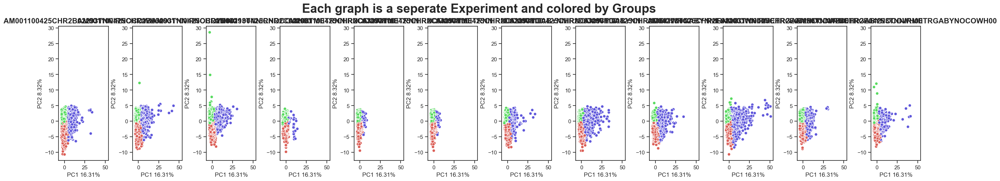

3


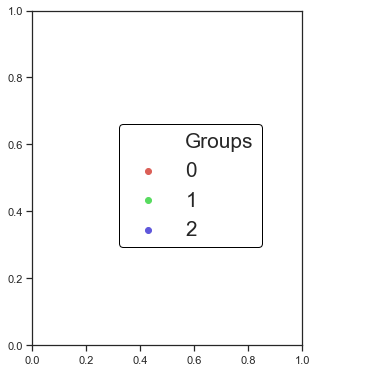

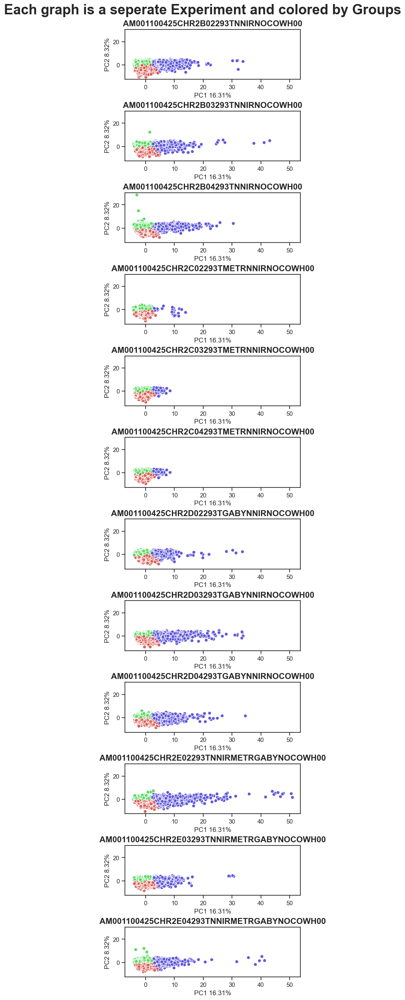

<IPython.core.display.Latex object>

3


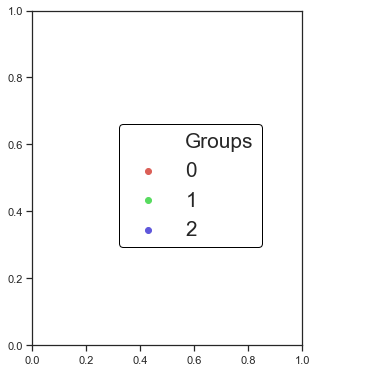

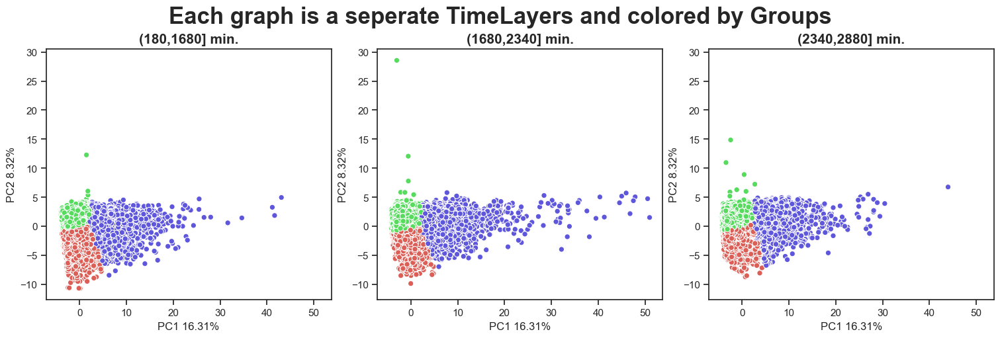

<IPython.core.display.Latex object>

3


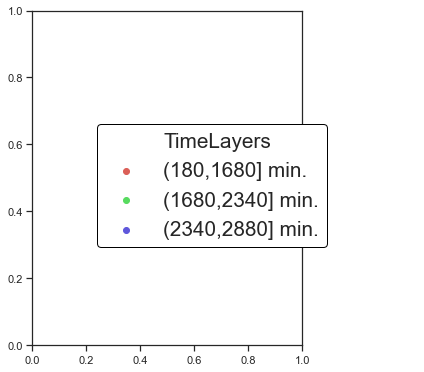

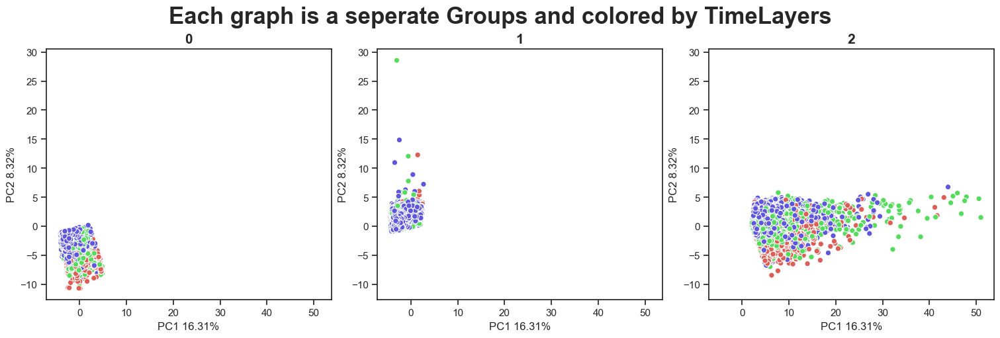

<IPython.core.display.Latex object>

1


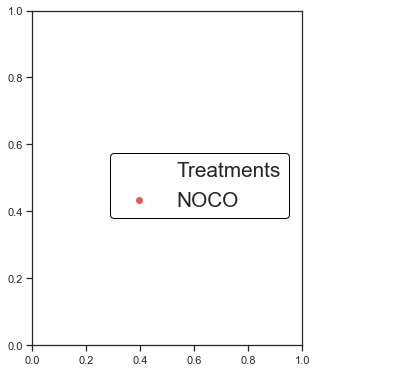

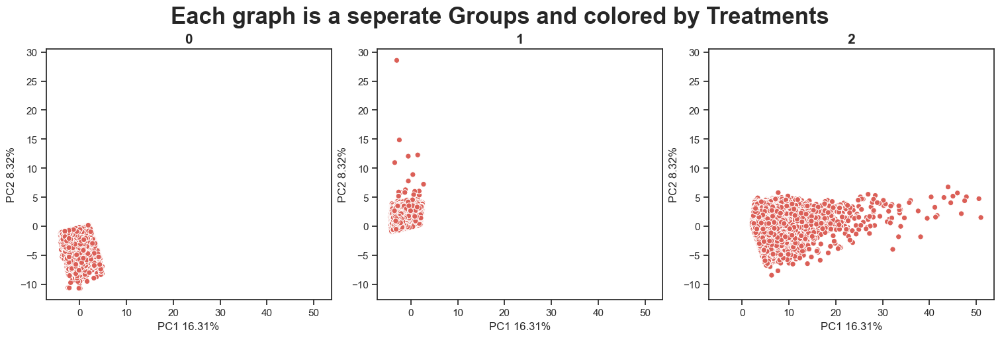

<IPython.core.display.Latex object>

3


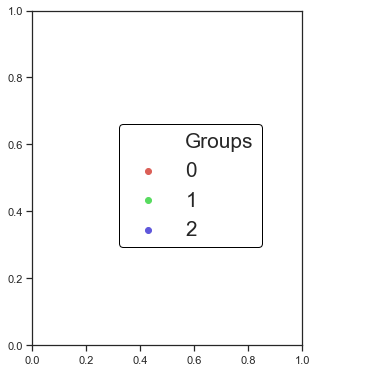

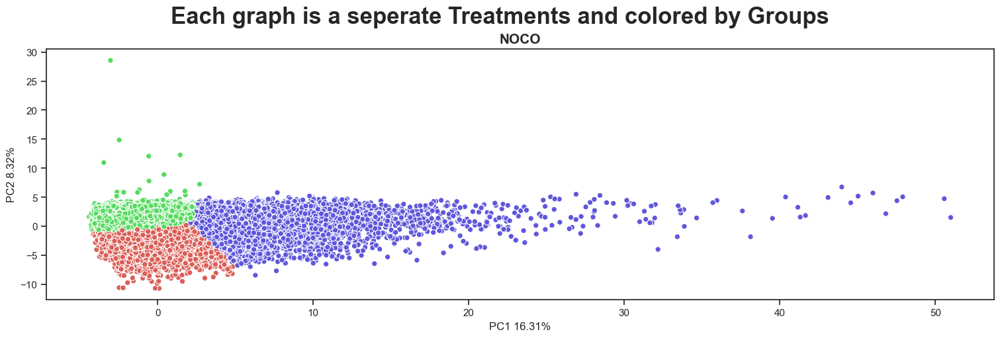

<IPython.core.display.Latex object>

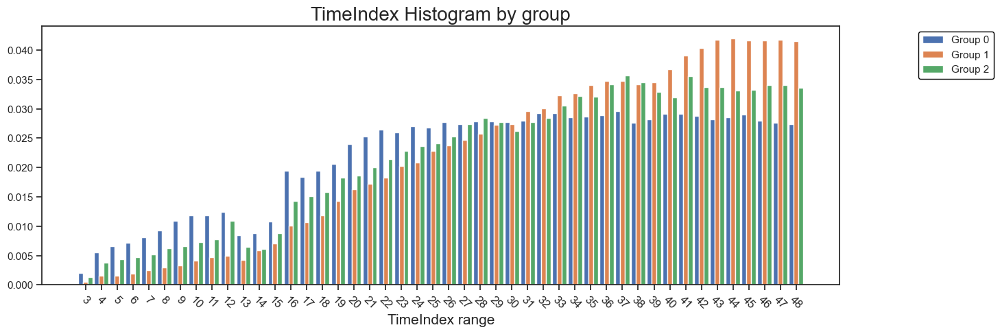

<IPython.core.display.Latex object>

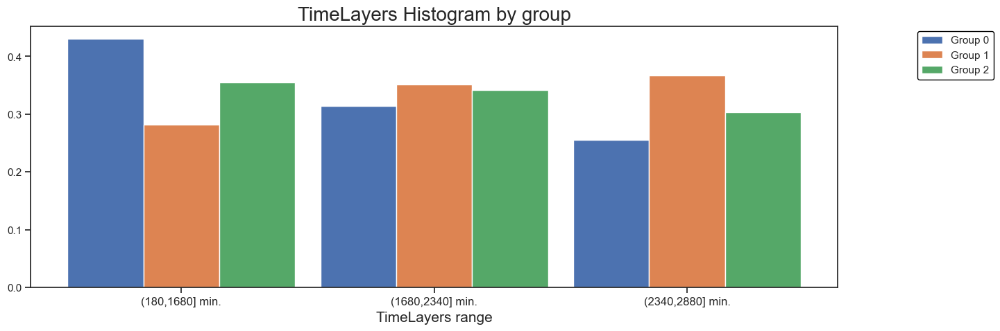

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

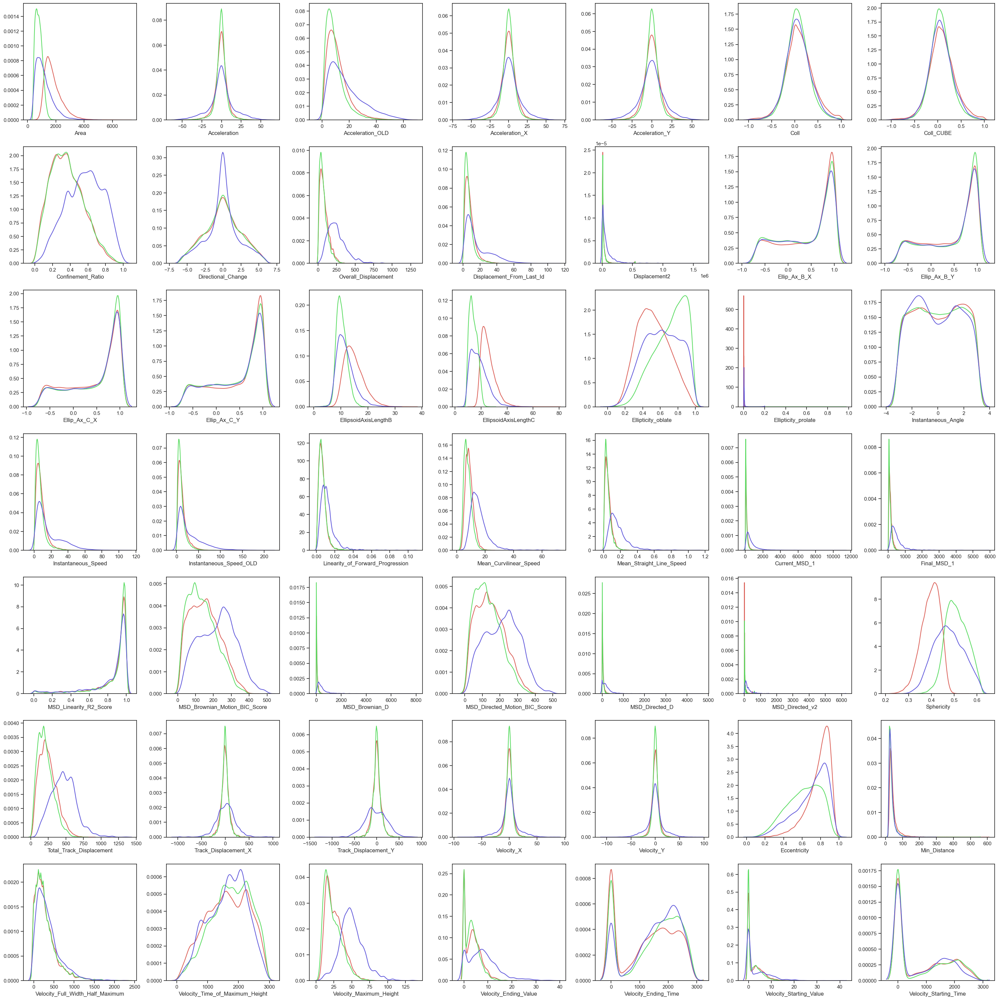

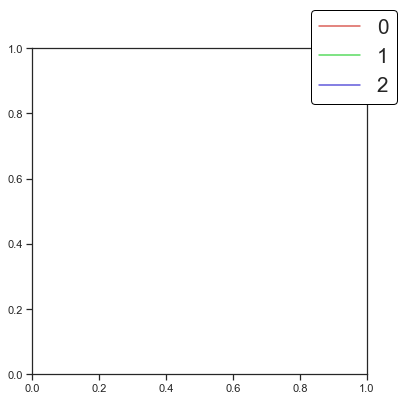

In [18]:
###### DO NOT CHANGE THESE: ######
columnsToDrop = ['Experiment','ID','TimeIndex','y_Pos','x_Pos','dt','Parent'] ## Columns to Drop
labelsCol = 'Experiment'  ## Label to Encode
FigureNumber=3
## number of group for the k-means analysis
# k_cluster = 3
# Clustergram, PCA, k-means, TimePoints 
if MorphoOut:
    dataDrop = dataSpecGraphN.drop(columns=MorphoFeatures+columnsToDrop).copy()
else:
    dataDrop = dataSpecGraphN.drop(columns=columnsToDrop).copy()
if MorphoIn:
    dataDrop = dataSpecGraphN[MorphoFeatures[:-1]].copy()
    
    
dataLabel = dataSpecGraphN[['Experiment','TimeIndex','dt','y_Pos']].copy()
pca_df, FigureNumber, kmeans_pca, labelsT, k_cluster, AE_df, pca = TASC(dataDrop, 
                                                        dataLabel, 
                                                        labelsCol=['Experiment','Treatments','Layers','TimeLayers'], 
                                                        LE=[True, False, False, False], 
                                                        title=title, 
                                                        HC=HC,
                                                        combTreats=combin, 
                                                        LY = 9, TI = 3,
                                                        k_cluster = k_cluster,
                                                        multipleCL=multipleCL,
                                                        singleTREAT=singleTREAT,
                                                        FigureNumber=FigureNumber, 
                                                        nrows=nrows, ncols=ncols, 
                                                        nColor=nColor, nShades=nShades, 
                                                        nColorTreat=nColorTreat, nShadesTreat=nShadesTreat, 
                                                        nColorLay=nColorLay, nShadesLay=nShadesLay, 
                                                        figsizeEXP=figsizeEXP, figsizeTREATS=figsizeTREATS, 
                                                        figsizeCL=figsizeCL,
                                                        Features=Features, AE_model=AE_model, 
                                                        model_name=model_name)


## pca_df, FigureNumber, kmeans_pca, labelsT, AE_df


display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par = 'TimeIndex'
pca_df[Par] = dataSpecGraphN[Par].values.copy()
histByKmeans(pca_df,Par,k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),rotate=-45)


display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par = 'TimeLayers'
histByKmeans(pca_df,'TimeLayers',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=labelsT)


display(Latex('$\color{blue}{\Large Distribution\ all\ features\ by\ groups}$'))
## kmeans groups clustering
Groups = range(k_cluster)
dataSpecGraphN['Groups'] = kmeans_pca['Groups'].copy()
histogramDataKDELabels(Groups,dataSpecGraphN,Features[:-1],FigureNumber,Par='Groups',nColor=0, nShades=0)
FigureNumber+=1

<IPython.core.display.Latex object>

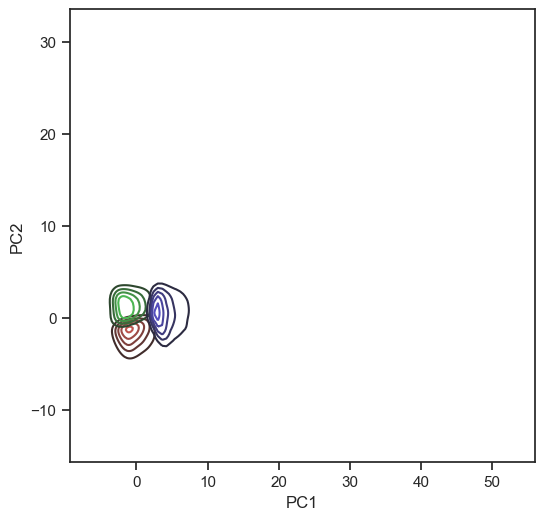

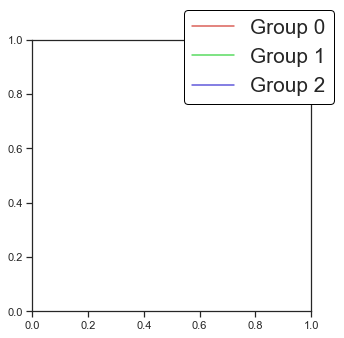

In [20]:
## Topographic k-means in PCA
FigureNumber = 28
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
fig1, ax1 = plt.subplots(figsize=(6,6), dpi=100)
fig2, ax2 = plt.subplots(figsize=(5,5))
dataSpecGraphN['PC1'] = kmeans_pca['PC1'].copy()
dataSpecGraphN['PC2'] = kmeans_pca['PC2'].copy()
# dataEXP = dataSpecGraphN.groupby(['Experiment'])
palette = sns.color_palette("hls", len(Groups))
# for ex, a1 in zip(exp, ax1.reshape(-1)):
#     exp_df = dataEXP.get_group(ex)
uPar1tmp = kmeans_pca['Groups'].unique()
uPar1tmp.sort()
pal = iter(sns.color_palette([palette[p] for p in [Groups.index(value) for value in uPar1tmp]]))
for g in uPar1tmp:
    if len(kmeans_pca['PC1'].loc[kmeans_pca['Groups']==g])>3:
        sns.kdeplot(kmeans_pca['PC1'].loc[kmeans_pca['Groups']==g], kmeans_pca['PC2'].loc[kmeans_pca['Groups']==g],
                    label='Group '+str(g), n_levels=5, bw=.5, ax=ax1, color=next(pal), cut=10)
    else:
        next(pal);
#     a1.autoscale(enable=True, tight=True)
#     a1.set_xlim([pca_df['PC1'].min()+0.1*exp_df['PC1'].min(), pca_df['PC1'].max()-0.1*pca_df['PC1'].max()])
#     a1.set_ylim([pca_df['PC2'].min()+0.1*exp_df['PC2'].min(), pca_df['PC2'].max()-0.1*pca_df['PC2'].max()])
#     a1.set_title(ex)

labels_handles1 = {label: handle for ax1 in fig1.axes for handle, label in zip(*ax1.get_legend_handles_labels())}

# fig1.subplots_adjust(right=0.8)


# for a in ax1.flat:
#     try:    
# ax1.get_legend().remove()
#     except:
#         continue
fig2.legend(labels_handles1.values(),
            labels_handles1.keys(),
            loc='upper right',fontsize='xx-large',
            framealpha=1,edgecolor='black')
# fig2.subplots_adjust(right=0.5)


plt.show()

<IPython.core.display.Latex object>

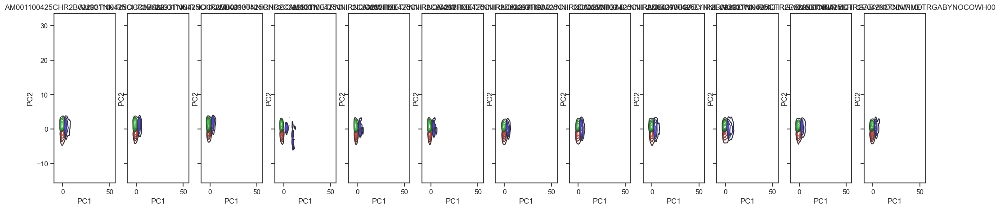

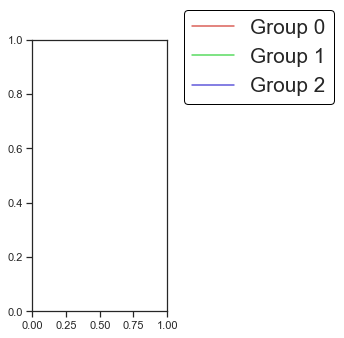

In [22]:
## Topographic k-means in PCA
FigureNumber = 29
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
fig1, ax1 = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsizeEXP, dpi=100,sharex=True, sharey=True)
fig2, ax2 = plt.subplots(figsize=(5,5))
dataSpecGraphN['PC1'] = kmeans_pca['PC1'].copy()
dataSpecGraphN['PC2'] = kmeans_pca['PC2'].copy()
dataEXP = dataSpecGraphN.groupby(['Experiment'])
palette = sns.color_palette("hls", len(Groups))
for ex, a1 in zip(exp, ax1.reshape(-1)):
    exp_df = dataEXP.get_group(ex)
    uPar1tmp = exp_df['Groups'].unique()
    uPar1tmp.sort()
    pal = iter(sns.color_palette([palette[p] for p in [Groups.index(value) for value in uPar1tmp]]))
    for g in uPar1tmp:
        if len(exp_df['PC1'].loc[exp_df['Groups']==g])>3:
            sns.kdeplot(exp_df['PC1'].loc[exp_df['Groups']==g], exp_df['PC2'].loc[exp_df['Groups']==g],
                        label='Group '+str(g), n_levels=5, bw=.5, ax=a1, color=next(pal), cut=10)
        else:
            next(pal);
    a1.autoscale(enable=True, tight=True)
#     a1.set_xlim([pca_df['PC1'].min()+0.1*exp_df['PC1'].min(), pca_df['PC1'].max()-0.1*pca_df['PC1'].max()])
#     a1.set_ylim([pca_df['PC2'].min()+0.1*exp_df['PC2'].min(), pca_df['PC2'].max()-0.1*pca_df['PC2'].max()])
    a1.set_title(ex)

labels_handles1 = {label: handle for ax1 in fig1.axes for handle, label in zip(*ax1.get_legend_handles_labels())}

# fig1.subplots_adjust(right=0.8)


for a in ax1.flat:
    try:    
        a.get_legend().remove()
    except:
        continue
fig2.legend(labels_handles1.values(),
            labels_handles1.keys(),
            loc='upper right',fontsize='xx-large',
            framealpha=1,edgecolor='black')
fig2.subplots_adjust(right=0.5)


plt.show()

<IPython.core.display.Latex object>

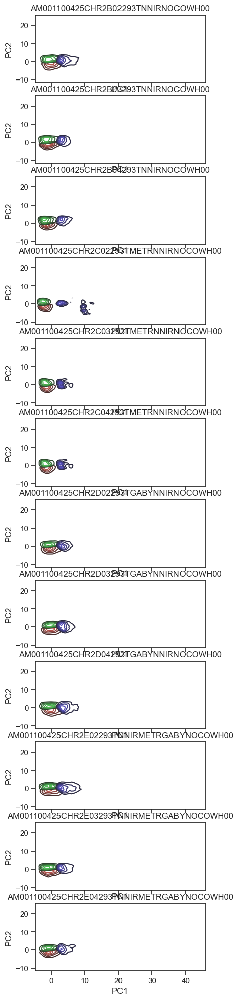

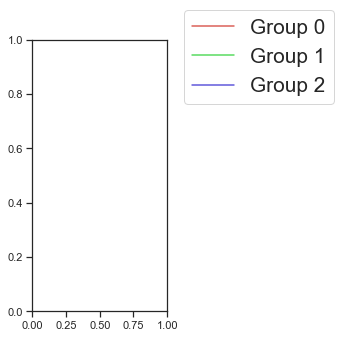

In [23]:
## Topographic k-means in PCA
FigureNumber = 29
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
fig1, ax1 = plt.subplots(nrows=ncols, ncols=nrows, figsize=figsizeEXP[::-1],dpi=100,sharex=True, sharey=True)
fig2, ax2 = plt.subplots(figsize=(5,5))
dataSpecGraphN['PC1'] = kmeans_pca['PC1'].copy()
dataSpecGraphN['PC2'] = kmeans_pca['PC2'].copy()
dataEXP = dataSpecGraphN.groupby(['Experiment'])
palette = sns.color_palette("hls", len(Groups))
for ex, a1 in zip(exp, ax1.reshape(-1)):
    exp_df = dataEXP.get_group(ex)
    uPar1tmp = exp_df['Groups'].unique()
    uPar1tmp.sort()
    pal = iter(sns.color_palette([palette[p] for p in [Groups.index(value) for value in uPar1tmp]]))
    for g in uPar1tmp:
        if len(exp_df['PC1'].loc[exp_df['Groups']==g])>3:
            sns.kdeplot(exp_df['PC1'].loc[exp_df['Groups']==g], exp_df['PC2'].loc[exp_df['Groups']==g],
                        label='Group '+str(g), n_levels=5, bw=.5, ax=a1, color=next(pal), cut=10)
        else:
            next(pal);
    a1.autoscale(enable=True, tight=True)
    a1.set_xlim([pca_df['PC1'].min()+0.1*exp_df['PC1'].min(), pca_df['PC1'].max()-0.1*pca_df['PC1'].max()])
    a1.set_ylim([pca_df['PC2'].min()+0.1*exp_df['PC2'].min(), pca_df['PC2'].max()-0.1*pca_df['PC2'].max()])
    a1.set_title(ex)

labels_handles1 = {label: handle for ax1 in fig1.axes for handle, label in zip(*ax1.get_legend_handles_labels())}


for a in ax1.flat:
    try:    
        a.get_legend().remove()
    except:
        continue

fig1.subplots_adjust(right=0.8)
fig2.legend(labels_handles1.values(),
           labels_handles1.keys(),
           loc='upper right',fontsize='xx-large',
          )
fig2.subplots_adjust(right=0.5)

plt.show()

<IPython.core.display.Latex object>

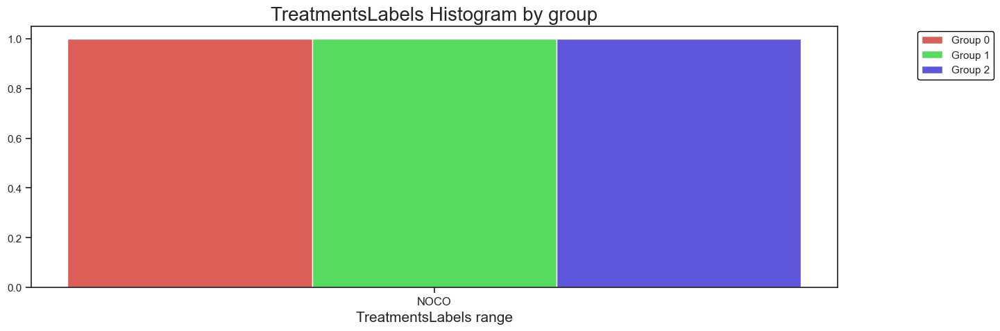

<IPython.core.display.Latex object>

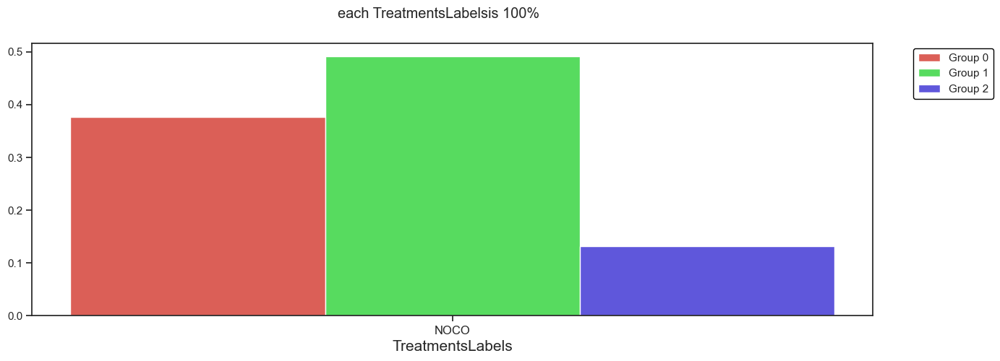

<IPython.core.display.Latex object>

ERROR


<IPython.core.display.Latex object>

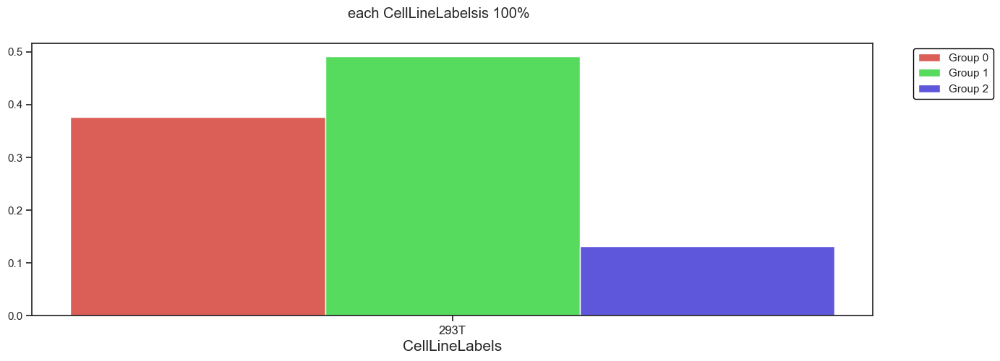

<IPython.core.display.Latex object>

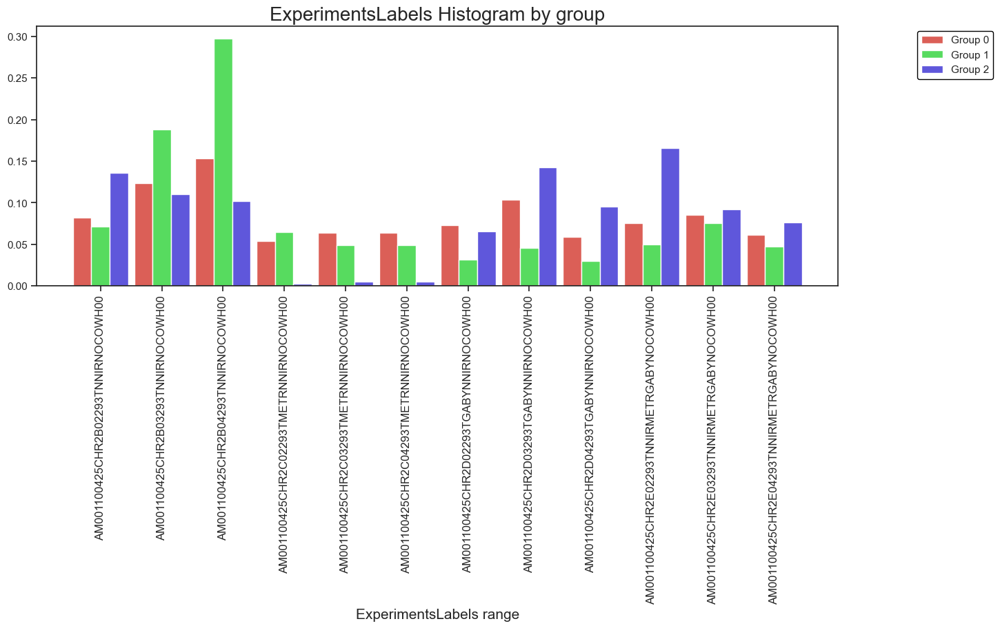

<IPython.core.display.Latex object>

C:\Users\metlab24\Anaconda3\envs\TASC\lib\site-packages\researchpy\crosstab.py:81: RuntimeWarning: invalid value encountered in true_divide
  V = numpy.sqrt(test_val / (crosstab2.iloc[-1,-1] * min((crosstab2.shape[0] - 2), (crosstab2.shape[1] - 2))))


ERROR


<IPython.core.display.Latex object>

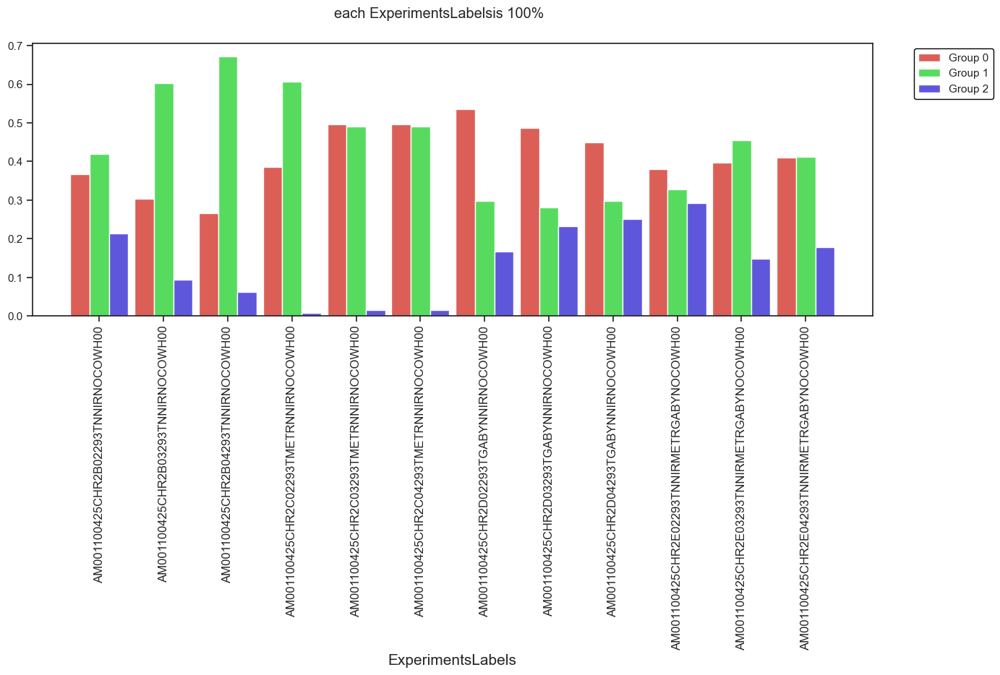

<IPython.core.display.Latex object>

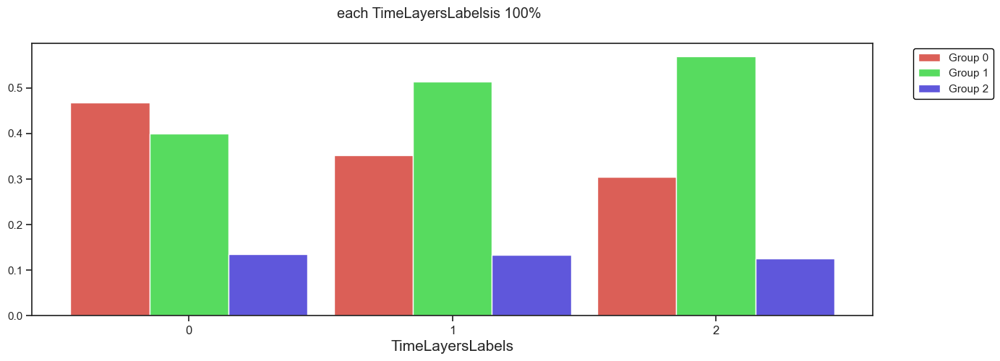

,0,1,2,All,N,Pearson Chi-square ( 2.0) =,p-value =,Cramer's V =
1,35.20,51.41,13.40,100.0,36877.0,1147.6418,0.0,0.1237
2,30.47,56.93,12.60,100.0,34731.0,2335.4079,0.0,0.1790
0,46.68,39.90,13.42,100.0,38179.0,NaN,NaN,NaN
All,NaN,NaN,NaN,NaN,109787.0,NaN,NaN,NaN


In [24]:
FigureNumber = 30
dataSpecGraphN['Treatments'] = pca_df['Treatments'].copy()
dataTreat = dataSpecGraphN.groupby(['Treatments'])

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par = 'Treatments'
lb_make = LabelEncoder()
pca_df['TreatmentsLabels'] = lb_make.fit_transform(pca_df[Par])
uLabelT = [u for u in pca_df['Treatments'].unique()]
histByKmeansTreats(pca_df,'TreatmentsLabels',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=uLabelT)

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par='TreatmentsLabels'
labels= list(pca_df.groupby('Treatments').describe().index.values)
histByKmeansTreatsLabel(pca_df,Par='TreatmentsLabels',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=labels,rotate=0)
if not singleTREAT:
    display(Latex('$\color{blue}{\Large Treatments p-Value}$'))
    labels= list(pca_df.groupby('Treatments').describe().index.values)
    Par = 'Treatments'
    for expectation in CON:
        chi_square_test_tables(pca_df,labels,expectation=expectation,Par=Par)

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par='CellLine'
lb_make = LabelEncoder()
pca_df['CellLineLabels'] = lb_make.fit_transform(pca_df[Par])
labels= list(pca_df.groupby('CellLine').describe().index.values)
histByKmeansTreatsLabel(pca_df,Par='CellLineLabels',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=labels,rotate=0)

if multipleCL:
    for expectation in CL:
        display(Latex('$\color{blue}{\Large Cell Line p-Value %s}$'%(expectation)))
        labels= list(pca_df.groupby(Par).describe().index.values)
        chi_square_test_tables(pca_df,labels,expectation=expectation,Par=Par)

    
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par = 'Experiment'
lb_make = LabelEncoder()
pca_df['ExperimentsLabels'] = lb_make.fit_transform(pca_df[Par])
uLabelEXP = [u for u in pca_df['Experiment'].unique()]
histByKmeansTreats(pca_df,'ExperimentsLabels',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=uLabelEXP,rotate=90)

pca_df_E = pca_df.groupby('CellLine')

if not singleTREAT:
    labelsC = list(pca_df_E.describe().index.values)
    for cl in CL:
        labelsE = list(pca_df_E.get_group(cl).groupby(Par).describe().index.values)
        expectation = [well for well in wellCON if cl in well][0]
        display(Latex('$\color{blue}{\Large Experiments p-Value %s}$'%(expectation)))
        chi_square_test_tables(pca_df,labelsE,expectation=expectation,Par=Par)

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
labels= list(pca_df.groupby('Experiment').describe().index.values)
histByKmeansTreatsLabel(pca_df,Par='ExperimentsLabels',k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=labels,rotate=90)

## Figure 16,17 (100%)

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
Par='TimeLayersLabels'
lb_make = LabelEncoder()
pca_df[Par] = lb_make.fit_transform(pca_df['TimeLayers'])
labels= list(pca_df.groupby('TimeLayers').describe().index.values)
histByKmeansTreatsLabel(pca_df,Par=Par,k_cluster=k_cluster,bar_width=0.3,figsize=(15,5),labels=labels,rotate=0)
Par = 'TimeLayers'
expectation = labels[0]
chi_square_test_tables(pca_df,labels,expectation=expectation,Par=Par)

In [25]:
controls.sort(key=len, reverse=True)
COMB = []
if not singleCONTROL:
    for ex in pca_df['Experiment']:
        TF = False
        for cont in controls:
            if cont in ex and TF==False:
                COMB += [cont]
                TF = True
    pca_df['CONTROLS'] = COMB

    Par='Experiment'
    pca_df_C = pca_df.groupby('CONTROLS')
    for cl in controls:
        labelsE = list(pca_df_C.get_group(cl).groupby(Par).describe().index.values)
        expectation = [well for well in wellCON if cl in well][0]
        display(Latex('$\color{blue}{\Large Experiments p-Value %s}$'%(expectation)))
        chi_square_test_tables(pca_df_C.get_group(cl),labelsE,expectation=expectation,Par=Par)

<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

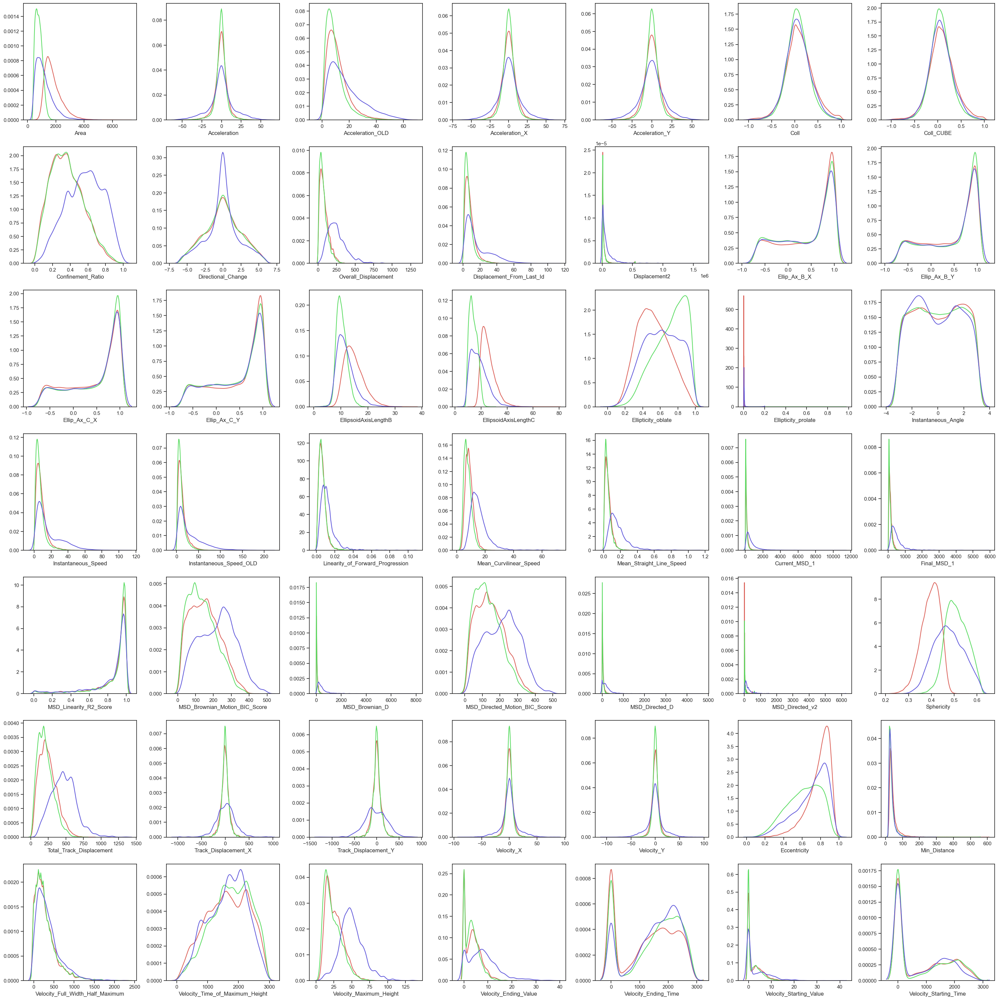

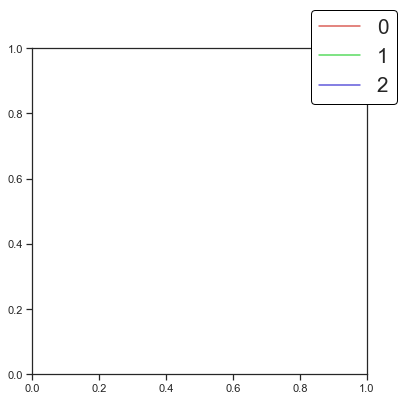

In [26]:
for treat in uLabelT:
    display(Latex('$\color{blue}{\Large Figure\ %s}$'%(treat)))
    histogramDataKDELabels(Groups,dataTreat.get_group(treat),Features[:-1],FigureNumber,Par='Groups',nColor=0, nShades=0)
    FigureNumber+=1
    

# for ex in uLabelEXP:
#     display(Latex('$\color{blue}{\Large Figure\ %s}$'%(ex)))
#     histogramDataKDELabels(Groups,dataEXP.get_group(ex),Features[:-1],FigureNumber,Par='Groups',nColor=k_cluster, nShades=1)
#     FigureNumber+=1


<IPython.core.display.Latex object>

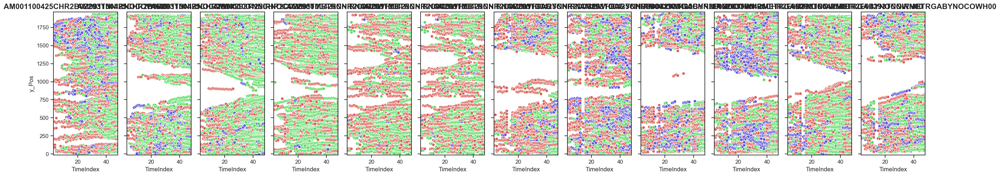

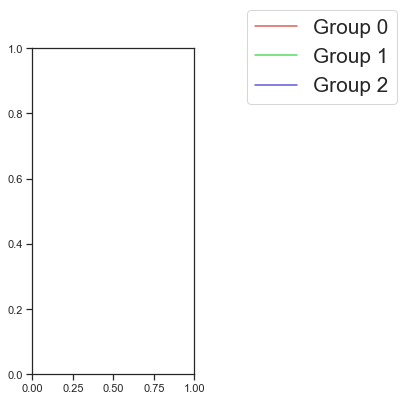

In [27]:
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsizeEXP,dpi=100,sharex=True, sharey=True)
fig2, ax2 = plt.subplots(figsize=(6,6))
dataEXP = dataSpecGraphN.groupby(['Experiment'])
palette = sns.color_palette("hls", len(Groups))
for ex, a in zip(exp, ax.reshape(-1)):
    exp_df = dataEXP.get_group(ex)
    uPar1tmp = exp_df['Groups'].unique()
    uPar1tmp.sort()
    pal = sns.color_palette([palette[p] for p in [Groups.index(value) for value in uPar1tmp]])

    sns.scatterplot(x='TimeIndex', y='y_Pos', hue='Groups', palette=pal, data=exp_df, ax=a)
    a.set_title(ex, fontweight='bold', fontsize=15);
    a.autoscale(enable=True, tight=True)
labels_handles = {label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.tight_layout(pad=1.02)

# fig.legend(labels_handles.values(),
#            labels_handles.keys(),
#            loc='upper right',fontsize='xx-large',
# #            bbox_transform=plt.gcf().transFigure,
#           )

for a in ax.flat:
    try:
        a.get_legend().remove()
    except:
        continue

# fig.subplots_adjust(right=0.8)
fig2.legend(labels_handles1.values(),
           labels_handles1.keys(),
           loc='upper right',fontsize='xx-large',
          )
fig2.subplots_adjust(right=0.5)
plt.show()


<IPython.core.display.Latex object>

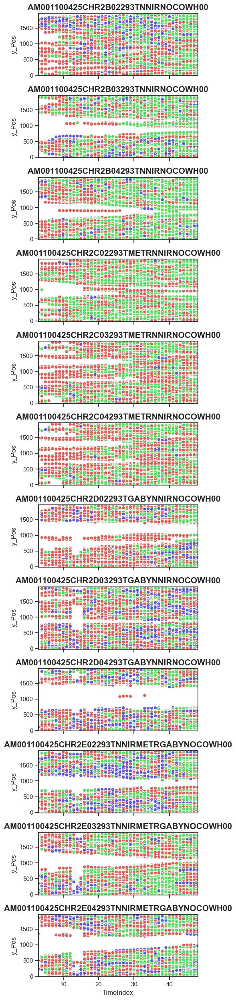

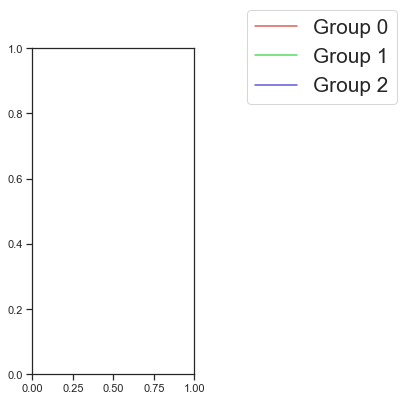

In [28]:
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
FigureNumber+=1
fig, ax = plt.subplots(nrows=ncols, ncols=nrows, figsize=figsizeEXP[::-1],dpi=100,sharex=True, sharey=True)
fig2, ax2 = plt.subplots(figsize=(6,6))
dataEXP = dataSpecGraphN.groupby(['Experiment'])
palette = sns.color_palette("hls", len(Groups))
for ex, a in zip(exp, ax.reshape(-1)):
    exp_df = dataEXP.get_group(ex)
    uPar1tmp = exp_df['Groups'].unique()
    uPar1tmp.sort()
    pal = sns.color_palette([palette[p] for p in [Groups.index(value) for value in uPar1tmp]])

    sns.scatterplot(x='TimeIndex', y='y_Pos', hue='Groups', palette=pal, data=exp_df, ax=a)
    a.set_title(ex, fontweight='bold', fontsize=15);
    a.autoscale(enable=True, tight=True)
labels_handles = {label: handle for ax in fig.axes for handle, label in zip(*ax.get_legend_handles_labels())}
fig.tight_layout(pad=1.02)


for a in ax.flat:
    try:
        a.get_legend().remove()
    except:
        continue

fig2.legend(labels_handles1.values(),
           labels_handles1.keys(),
           loc='upper right',fontsize='xx-large',
          )
fig2.subplots_adjust(right=0.5)
plt.show()

In [29]:
dataSpecGraphGroups = dataSpecGraphN.copy()
dataSpecGraphGroups['Groups'] = kmeans_pca['Groups'].copy()

display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
display(Latex('$\color{blue}{\Large Descriptive\ Table}$'))
DescriptiveTable(dataSpecGraphGroups,path+title)


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Area                                         \
            N         Mean std. Deviation std. Error   
Groups                                                 
0       41382  1814.965459     622.765192   3.061390   
1       53963   799.898378     244.423058   1.052190   
2       14442  1164.873726     589.793516   4.907794   

                                                    \
       95 confidence Interval for Mean Upper Bound   
Groups                                               
0                                      1820.965710   
1                                       801.960651   
2                                      1174.492669   

                                                   Acceleration            \
       95 confidence Interval for Mean Lower Bound            N      Mean   
Groups                                                                      
0                                      1808.965208        41382 -0.470767   
1                                       797.836105        53963 -0.481862   
2                                      1155.254783        14442 -0.142011   

                                  ...            PC1             \
       std. Deviation std. Error  ... std. Deviation std. Error   
Groups                            ...                             
0            8.136023   0.039995  ...       1.488189   0.007316   
1            7.123439   0.030665  ...       1.416882   0.006099   
2           15.711007   0.130735  ...       3.654871   0.030413   

                                                    \
       95 confidence Interval for Mean Upper Bound   
Groups                                               
0                                        -0.408869   
1                                        -1.091784   
2                                         5.396420   

                                                      PC2            \
       95 confidence Interval for Mean Lower Bound      N      Mean   
Groups                                                                
0                                        -0.437546  41382 -1.967484   
1                                        -1.115694  53963  1.385998   
2                                         5.277205  14442  0.458791   

                                                                              \
       std. Deviation std. Error 95 confidence Interval for Mean Upper Bound   
Groups                                                                         
0            1.314579   0.006462                                   -1.954819   
1            1.055833   0.004545                                    1.394906   
2            1.842703   0.015334                                    0.488843   

                                                    
       95 confidence Interval for Mean Lower Bound  
Groups                                              
0                                        -1.980150  
1                                         1.377089  
2                                         0.428738  

[3 rows x 342 columns]

In [30]:
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
display(Latex('$\color{blue}{\Large ANOVA\ -\ OneWay}$'))
for col in dataSpecGraphGroups.columns:
    try:
        dataSpecGraphGroups[col] = np.float64(dataSpecGraphGroups[col])
    except:
        print(col)
ANOVA_TABLE(dataSpecGraphGroups, Features, path+title, dep='Groups')


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

Experiment
Treatments


<IPython.core.display.Latex object>

Between Groups       \
                                         Sum of Squares   df   
Area                                 24203983216.417446  2.0   
Acceleration                                1410.730702  2.0   
Acceleration_OLD                          765834.635506  2.0   
Acceleration_X                                34.910033  2.0   
Acceleration_Y                               472.101259  2.0   
Coll                                          22.396758  2.0   
Coll_CUBE                                     20.397846  2.0   
Confinement_Ratio                            494.739542  2.0   
Directional_Change                            39.324191  2.0   
Overall_Displacement                   374614334.980128  2.0   
Displacement_From_Last_Id                1197250.923767  2.0   
Displacement2                     50606611125306.632812  2.0   
Ellip_Ax_B_X                                  56.820877  2.0   
Ellip_Ax_B_Y                                  28.669062  2.0   
Ellip_Ax_C_X                                  58.413248  2.0   
Ellip_Ax_C_Y                                  26.169068  2.0   
EllipsoidAxisLengthB                      474028.433643  2.0   
EllipsoidAxisLengthC                     3014569.176032  2.0   
Ellipticity_oblate                           851.973939  2.0   
Ellipticity_prolate                            0.137504  2.0   
Instantaneous_Angle                           96.626681  2.0   
Instantaneous_Speed                      1197250.923767  2.0   
Instantaneous_Speed_OLD                  4325101.134901  2.0   
Linearity_of_Forward_Progression               0.355332  2.0   
Mean_Curvilinear_Speed                     686798.22608  2.0   
Mean_Straight_Line_Speed                     175.517592  2.0   
Current_MSD_1                         4287587384.871761  2.0   
Final_MSD_1                           1721788454.674191  2.0   
MSD_Linearity_R2_Score                         9.361198  2.0   
MSD_Brownian_Motion_BIC_Score           81580300.838068  2.0   
MSD_Brownian_D                        2514371054.982041  2.0   
MSD_Directed_Motion_BIC_Score           76642826.240771  2.0   
MSD_Directed_D                         412748964.326488  2.0   
MSD_Directed_v2                        246984884.724222  2.0   
Sphericity                                   307.362127  2.0   
Total_Track_Displacement               759003012.030119  2.0   
Track_Displacement_X                     3945163.994407  2.0   
Track_Displacement_Y                     6816185.579741  2.0   
Velocity_X                                   604.868165  2.0   
Velocity_Y                                   5555.03236  2.0   
Eccentricity                                 613.624763  2.0   
Min_Distance                             2532213.795677  2.0   
Velocity_Full_Width_Half_Maximum        38738879.256246  2.0   
Velocity_Time_of_Maximum_Height        398000698.330711  2.0   
Velocity_Maximum_Height                  8203461.841248  2.0   
Velocity_Ending_Value                     239925.282062  2.0   
Velocity_Ending_Time                  1115508044.599074  2.0   
Velocity_Starting_Value                    25545.059138  2.0   
Velocity_Starting_Time                   145200440.7464  2.0   

                                                                       \
                                            Mean Square             F   
Area                                 12101991608.208723  54683.459095   
Acceleration                                 705.365351      8.564256   
Acceleration_OLD                          382917.317753   5769.997163   
Acceleration_X                                17.455016      0.178713   
Acceleration_Y                               236.050629      2.300978   
Coll                                          11.198379    157.510729   
Coll_CUBE                                     10.198923    161.854351   
Confinement_Ratio                            247.369771   6981.057796   
Directional_Change                            

In [32]:
display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
display(Latex('$\color{blue}{\Large ANOVA\ -\ OneWay}$'))
dataSpecGraphGroups['CellLine'] = pca_df['CellLine'].copy()
dataSpecGraphGroupsCL = dataSpecGraphGroups.groupby('CellLine')

if multipleCL:
    for cl in CL:
        display(Latex('$\color{blue}{\Large ANOVA\ -\ OneWay\ %s}$'%(cl)))
        ANOVA_TABLE(dataSpecGraphGroupsCL.get_group(cl), Features, path+title+' '+cl, dep='Groups')


<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [33]:
dataSpecGraphGroups = dataSpecGraphN.copy()
dataSpecGraphGroups['Groups'] = kmeans_pca['Groups'].copy()



display(Latex('$\color{blue}{\Large Figure\ %i}$'%(FigureNumber)))
display(Latex('$\color{blue}{\Large Descriptive\ Table}$'))
if multipleCL:
    for cl in CL:
        display(Latex('$\color{blue}{\Large Descriptive\ Table\ %s}$'%(cl)))
        DescriptiveTable(dataSpecGraphGroupsCL.get_group(cl),path+title+' '+cl)



<IPython.core.display.Latex object>

<IPython.core.display.Latex object>

In [30]:
with open(path+title+'split.pickle', 'wb') as f:
    pickle.dump([pca_df, FigureNumber, kmeans_pca, labelsT, k_cluster, AE_df,
                dataSpecGraphN, dataEXP, Groups, Features, exp, pca], f)
